# **Detección de Objetos de Residuos Sólidos: Implementación de Arquitectura Fast R-CNN from Scratch**

Autor: Bryan Daniel Martinez Cabezas

---



Materia: Inteligencia Artificial II

In [1]:
import torch
import os
import sys
from google.colab import drive
# A. Montar Google Drive
print(" Conectando con Google Drive...")
drive.mount('/content/drive')
PATH_BASE = '/content/drive/MyDrive/'
print(f"\n Directorio de trabajo raíz: {PATH_BASE}")

 Conectando con Google Drive...
Mounted at /content/drive

 Directorio de trabajo raíz: /content/drive/MyDrive/


# Fase 1: Exploración y Análisis de Datos

In [ ]:
import os
import glob

# Definicion de la ruta base
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

print(f"--- Inspeccion del Dataset (Estructura por Clases) ---")
print(f"Ruta Raiz: {BASE_DIR}\n")

if os.path.exists(BASE_DIR):
    # Obtener lista de carpetas (las 5 clases: Blister, Soldaditos, etc.)
    clases = [d for d in os.listdir(BASE_DIR) if os.path.isdir(os.path.join(BASE_DIR, d))]
    clases.sort()

    total_imgs = 0
    total_txts = 0

    # Encabezado de la tabla
    print(f"{'CLASE':<20} | {'SPLIT':<10} | {'IMAGENES':<10} | {'ETIQUETAS':<10} | {'ESTADO'}")
    print("-" * 75)

    for clase in clases:
        # Asumimos que dentro de cada clase hay 'train' y 'test'
        sub_sets = ['train', 'test']

        for sub_set in sub_sets:
            path_imgs = os.path.join(BASE_DIR, clase, sub_set, 'images')
            path_lbls = os.path.join(BASE_DIR, clase, sub_set, 'labels')

            # Verificar si existen las carpetas antes de contar
            if os.path.exists(path_imgs) and os.path.exists(path_lbls):
                n_imgs = len(glob.glob(os.path.join(path_imgs, '*.jpg')))
                n_txts = len(glob.glob(os.path.join(path_lbls, '*.txt')))

                # Estado
                if n_imgs == n_txts and n_imgs > 0:
                    estado = "OK"
                elif n_imgs == 0:
                    estado = "VACIO"
                else:
                    estado = f"DIF: {n_imgs-n_txts}"

                print(f"{clase:<20} | {sub_set:<10} | {n_imgs:<10} | {n_txts:<10} | {estado}")

                total_imgs += n_imgs
                total_txts += n_txts
            else:
                # Si alguna carpeta no existe (ej. quizas no hay test en alguna clase)
                print(f"{clase:<20} | {sub_set:<10} | {'--':<10} | {'--':<10} | NO ENCONTRADO")

    print("-" * 75)
    print(f"TOTAL GLOBAL: Imagenes: {total_imgs} | Etiquetas: {total_txts}")

else:
    print(f"Error: No se encuentra el directorio {BASE_DIR}")

--- Inspeccion del Dataset (Estructura por Clases) ---
Ruta Raiz: /content/drive/MyDrive/Dataset Oficial

CLASE                | SPLIT      | IMAGENES   | ETIQUETAS  | ESTADO
---------------------------------------------------------------------------
Blister              | train      | 8000       | 8000       | OK
Blister              | test       | 2000       | 2000       | OK
Cable                | train      | 8000       | 8000       | OK
Cable                | test       | 2000       | 2000       | OK
Cascaras_de_papa     | train      | 9595       | 9595       | OK
Cascaras_de_papa     | test       | 3595       | 3595       | OK
Cepillo_de_dientes   | train      | 8000       | 8000       | OK
Cepillo_de_dientes   | test       | 2000       | 2000       | OK
Soldaditos           | train      | 8000       | 8000       | OK
Soldaditos           | test       | 2000       | 2000       | OK
---------------------------------------------------------------------------
TOTAL GLOBAL: Imagenes:

In [ ]:
import os
import glob
import cv2
import numpy as np

# Ruta base del dataset
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

def obtener_promedio_global(ruta_base, tamaño_muestra=500):
    # Recolectar todas las rutas de imagenes recursivamente
    # Se asume extension jpg segun exploracion previa
    todas_imagenes = glob.glob(os.path.join(ruta_base, '**', '*.jpg'), recursive=True)

    total_encontrado = len(todas_imagenes)

    if total_encontrado == 0:
        print("No se encontraron imagenes para analizar.")
        return

    # Seleccionar una muestra aleatoria para no procesar 50k imagenes
    # Esto da un promedio estadisticamente valido rapidamente
    rng = np.random.default_rng(42)
    if total_encontrado > tamaño_muestra:
        muestra = rng.choice(todas_imagenes, size=tamaño_muestra, replace=False)
    else:
        muestra = todas_imagenes

    anchos = []
    altos = []

    for ruta in muestra:
        img = cv2.imread(ruta)
        if img is not None:
            h, w = img.shape[:2]
            anchos.append(w)
            altos.append(h)

    if anchos:
        promedio_w = int(np.mean(anchos))
        promedio_h = int(np.mean(altos))

        print(f"--- Resultado Global (Muestra de {len(muestra)} imagenes) ---")
        print(f"Resolucion Promedio del Dataset: {promedio_w} x {promedio_h}")
    else:
        print("Error al leer las imagenes de la muestra.")

# Ejecutar calculo
if os.path.exists(BASE_DIR):
    obtener_promedio_global(BASE_DIR)
else:
    print(f"Ruta no encontrada: {BASE_DIR}")

--- Resultado Global (Muestra de 500 imagenes) ---
Resolucion Promedio del Dataset: 789 x 601


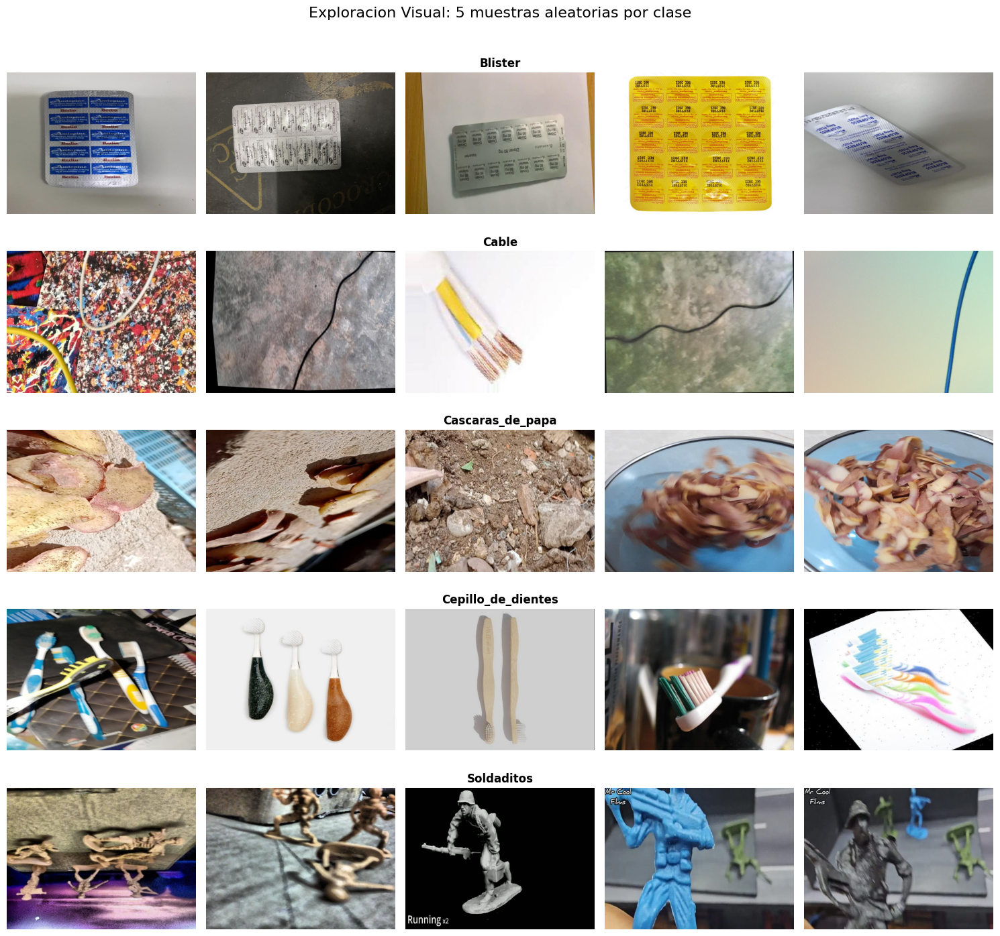

In [ ]:
import os
import glob
import random
import cv2
import matplotlib.pyplot as plt

# Definicion de la ruta base del dataset
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

def visualizar_muestras_por_clase(base_dir, num_muestras=5):
    # Verificacion de existencia del directorio base
    if not os.path.exists(base_dir):
        print(f"Error: Ruta no encontrada en {base_dir}")
        return

    # Obtencion de la lista de clases ordenada alfabeticamente
    clases = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
    clases.sort()

    total_clases = len(clases)
    if total_clases == 0:
        print("No se detectaron carpetas de clase.")
        return

    # Configuracion del lienzo de matplotlib
    # Se crea una grilla de (filas=clases, columnas=muestras)
    fig, axes = plt.subplots(total_clases, num_muestras, figsize=(15, 3 * total_clases))

    # Titulo general de la figura
    fig.suptitle(f'Exploracion Visual: {num_muestras} muestras aleatorias por clase', fontsize=16)

    for i, clase in enumerate(clases):
        ruta_clase = os.path.join(base_dir, clase)

        # Busqueda recursiva de imagenes jpg en la carpeta de la clase
        imagenes = glob.glob(os.path.join(ruta_clase, '**', '*.jpg'), recursive=True)

        # Seleccion de muestras
        # Si hay suficientes imagenes se usa random sample
        # Si no se toman todas las disponibles
        if len(imagenes) >= num_muestras:
            seleccion = random.sample(imagenes, num_muestras)
        else:
            seleccion = imagenes
            # Rellenar con None si faltan imagenes para completar la fila
            seleccion += [None] * (num_muestras - len(imagenes))

        # Iteracion por columnas para mostrar las imagenes
        for j, img_path in enumerate(seleccion):
            # Manejo de indices para subplot
            # Si hay una sola clase axes es 1D sino es 2D
            if total_clases > 1:
                ax = axes[i, j]
            else:
                ax = axes[j]

            if img_path:
                # Lectura de imagen con OpenCV
                img = cv2.imread(img_path)
                if img is not None:
                    # Conversion de espacio de color BGR a RGB para matplotlib
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    ax.imshow(img)
                else:
                    # Marcador visual en caso de imagen corrupta
                    ax.text(0.5, 0.5, 'Error Lectura', ha='center', va='center')
                    ax.set_facecolor('#f0f0f0')
            else:
                # Marcador visual si no hay imagen
                ax.text(0.5, 0.5, 'N/A', ha='center', va='center')

            # Configuracion de titulos y ejes
            # Solo se pone el titulo de la clase en la columna central
            if j == num_muestras // 2:
                ax.set_title(clase, fontsize=12, fontweight='bold')

            # Ocultar ejes coordenados para limpieza visual
            ax.axis('off')

    # Ajuste de espaciado para evitar superposiciones
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()

# Ejecucion de la funcion de visualizacion
visualizar_muestras_por_clase(BASE_DIR)

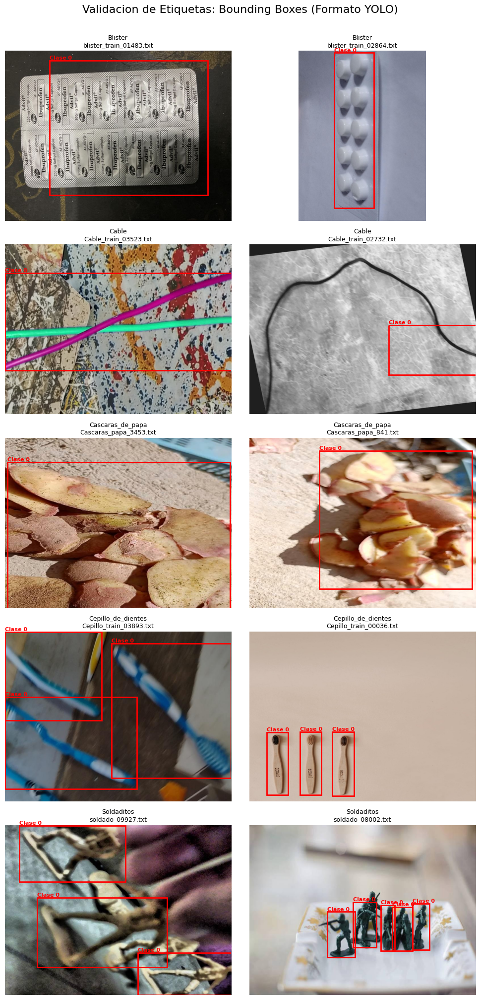

In [ ]:
# Celda 5: Visualizacion de Ground Truth (Bounding Boxes)
import os
import cv2
import random
import glob
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Configuracion de rutas
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

def visualizar_bboxes_yolo(base_dir, muestras_por_clase=2):
    # Verificacion de existencia
    if not os.path.exists(base_dir):
        print(f"Error: Ruta base no existe.")
        return

    clases = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
    clases.sort()

    total_clases = len(clases)
    if total_clases == 0:
        print("No se encontraron clases.")
        return

    # Configuracion del plot (Filas = Clases, Columnas = Muestras)
    fig, axes = plt.subplots(total_clases, muestras_por_clase, figsize=(10, 4 * total_clases))
    plt.suptitle("Validacion de Etiquetas: Bounding Boxes (Formato YOLO)", fontsize=16, y=1.005)

    for i, clase in enumerate(clases):
        # Asumimos que los datos estan en train para la visualizacion
        ruta_imgs = os.path.join(base_dir, clase, 'train', 'images')
        ruta_lbls = os.path.join(base_dir, clase, 'train', 'labels')

        # Obtener lista de imagenes
        imagenes = glob.glob(os.path.join(ruta_imgs, '*.jpg'))

        if not imagenes:
            print(f"Clase {clase}: No se encontraron imagenes en {ruta_imgs}")
            continue

        # Seleccion aleatoria
        seleccion = random.sample(imagenes, min(len(imagenes), muestras_por_clase))

        for j, img_path in enumerate(seleccion):
            # Configurar el eje correcto
            if total_clases > 1:
                ax = axes[i, j]
            else:
                ax = axes[j] if muestras_por_clase > 1 else axes

            # Cargar imagen
            img = cv2.imread(img_path)
            if img is None:
                ax.text(0.5, 0.5, "Error Lectura", ha='center')
                continue

            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            h_img, w_img = img.shape[:2]

            # Mostrar imagen base
            ax.imshow(img)

            # Buscar archivo de etiqueta correspondiente
            nombre_base = os.path.basename(img_path)
            nombre_txt = os.path.splitext(nombre_base)[0] + '.txt'
            txt_path = os.path.join(ruta_lbls, nombre_txt)

            if os.path.exists(txt_path):
                # Leer y dibujar cajas
                with open(txt_path, 'r') as f:
                    lineas = f.readlines()

                for linea in lineas:
                    partes = linea.strip().split()
                    if len(partes) >= 5:
                        # Formato YOLO: class x_center y_center width height
                        # Todo normalizado entre 0 y 1
                        cls_id = int(partes[0])
                        x_c = float(partes[1])
                        y_c = float(partes[2])
                        w_box = float(partes[3])
                        h_box = float(partes[4])

                        # Conversion a pixeles para matplotlib (esquina superior izquierda)
                        w_px = w_box * w_img
                        h_px = h_box * h_img
                        x_min = (x_c * w_img) - (w_px / 2)
                        y_min = (y_c * h_img) - (h_px / 2)

                        # Crear rectangulo
                        rect = patches.Rectangle(
                            (x_min, y_min), w_px, h_px,
                            linewidth=2, edgecolor='red', facecolor='none'
                        )
                        ax.add_patch(rect)

                        # Etiqueta de texto (opcional)
                        ax.text(x_min, y_min - 5, f"Clase {cls_id}", color='red', fontsize=8, fontweight='bold')

                ax.set_title(f"{clase}\n{nombre_txt}", fontsize=9)
            else:
                ax.text(0.5, 0.5, "TXT No Encontrado", color='red', ha='center', fontweight='bold')
                ax.set_title(f"{clase} (Sin etiqueta)", fontsize=9)

            ax.axis('off')

    plt.tight_layout()
    plt.show()

# Ejecucion
visualizar_bboxes_yolo(BASE_DIR, muestras_por_clase=2)

--- Recuento de Imagenes por Clase ---
Blister: 10000
Cable: 10000
Cascaras_de_papa: 13190
Cepillo_de_dientes: 10000
Soldaditos: 10000


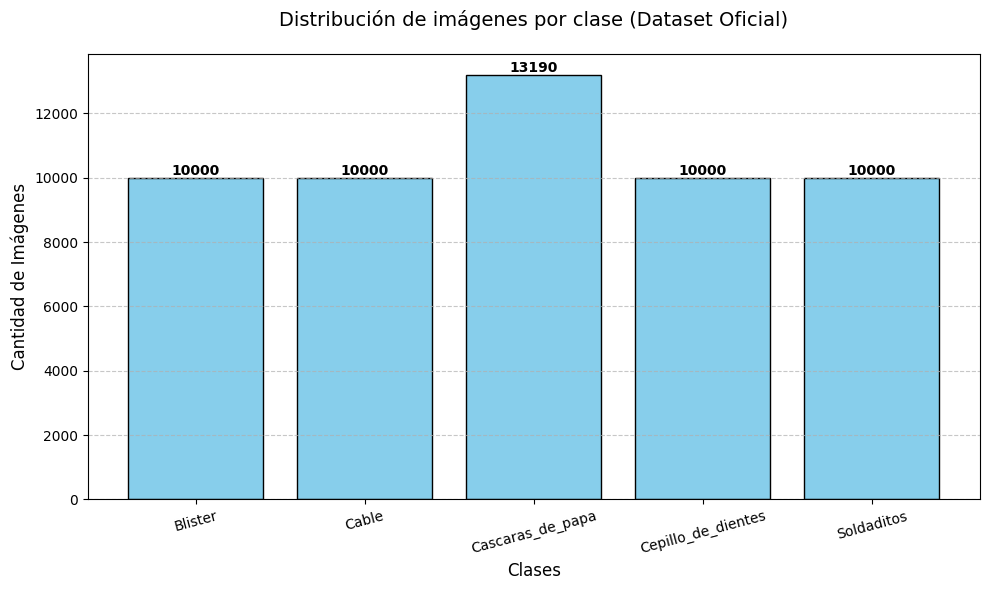

In [ ]:
import os
import glob
import matplotlib.pyplot as plt

# Configuracion de la ruta base
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

def graficar_distribucion_clases(base_dir):
    # Validacion de ruta
    if not os.path.exists(base_dir):
        print(f"Error: La ruta {base_dir} no existe.")
        return

    # Obtencion de clases
    clases = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
    clases.sort()

    conteos = []

    print("--- Recuento de Imagenes por Clase ---")

    for clase in clases:
        ruta_clase = os.path.join(base_dir, clase)

        # Busqueda recursiva de archivos .jpg
        # Esto asegura contar imagenes tanto en 'train/images' como en 'Segmentado/images'
        imagenes = glob.glob(os.path.join(ruta_clase, '**', '*.jpg'), recursive=True)

        # Agregamos conteo
        cantidad = len(imagenes)
        conteos.append(cantidad)
        print(f"{clase}: {cantidad}")

    # Generacion del Grafico
    plt.figure(figsize=(10, 6))
    barras = plt.bar(clases, conteos, color='#87CEEB', edgecolor='black') # Color Skyblue

    plt.title("Distribución de imágenes por clase (Dataset Oficial)", fontsize=14, pad=20)
    plt.xlabel("Clases", fontsize=12)
    plt.ylabel("Cantidad de Imágenes", fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(rotation=15) # Rotacion ligera para leer mejor los nombres

    # Añadir etiquetas de valor exacto sobre cada barra
    for barra in barras:
        altura = barra.get_height()
        plt.text(barra.get_x() + barra.get_width()/2., altura,
                 f'{int(altura)}',
                 ha='center', va='bottom', fontsize=10, fontweight='bold')

    plt.tight_layout()
    plt.show()

# Ejecucion
graficar_distribucion_clases(BASE_DIR)

# FASE 2: PROCESAMIENTO DE DATOS

In [3]:
# --- CELDA 7 (REPARADA): Dataset Robusto ---
import torch
from torch.utils.data import Dataset, DataLoader
import cv2
import os
import glob
import numpy as np

# Parametros globales
TARGET_SIZE = 300

class ResiduosDetectionDataset(Dataset):
    def __init__(self, root_dir, split='train'):
        """
        Args:
            root_dir: Ruta base (ej. '/content/drive/MyDrive/Dataset Oficial')
            split: 'train' o 'test'
        """
        self.root_dir = root_dir
        self.split = split
        self.samples = []

        # Mapeo de clases (LA VERDAD ABSOLUTA)
        self.class_map = {
            'Blister': 1,
            'Cable': 2,
            'Cascaras_de_papa': 3,
            'Cepillo_de_dientes': 4,
            'Soldaditos': 5
        }

        self.idx_to_class = {v: k for k, v in self.class_map.items()}
        self._indexar_archivos()

    def _indexar_archivos(self):
        if not os.path.exists(self.root_dir):
            print(f"Error: No existe el directorio {self.root_dir}")
            return

        clases = sorted([d for d in os.listdir(self.root_dir) if os.path.isdir(os.path.join(self.root_dir, d))])

        for clase in clases:
            # Si la clase no esta en nuestro mapa, la saltamos
            if clase not in self.class_map:
                continue

            real_class_id = self.class_map[clase]

            img_dir = os.path.join(self.root_dir, clase, self.split, 'images')
            lbl_dir = os.path.join(self.root_dir, clase, self.split, 'labels')

            if not os.path.exists(img_dir) or not os.path.exists(lbl_dir):
                continue

            imagenes = glob.glob(os.path.join(img_dir, '*.jpg'))

            for img_path in imagenes:
                nombre_base = os.path.basename(img_path)
                nombre_txt = os.path.splitext(nombre_base)[0] + '.txt'
                txt_path = os.path.join(lbl_dir, nombre_txt)

                if os.path.exists(txt_path):
                    self.samples.append({
                        'img_path': img_path,
                        'txt_path': txt_path,
                        'real_label': real_class_id
                    })

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        data = self.samples[idx]

        # 1. Cargar Imagen
        img = cv2.imread(data['img_path'])
        if img is None:
            # Si la imagen falla, devolvemos tensores vacios pero validos para no romper el batch
            print(f"Error: No se pudo leer la imagen {data['img_path']}")
            return torch.zeros((3, TARGET_SIZE, TARGET_SIZE)), {'boxes': torch.zeros((0, 4)), 'labels': torch.zeros((0,), dtype=torch.int64)}

        # Convertir BGR a RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h_orig, w_orig = img.shape[:2]

        # 2. Calcular factores de escala
        scale_x = TARGET_SIZE / w_orig
        scale_y = TARGET_SIZE / h_orig

        # Resize
        img_resized = cv2.resize(img, (TARGET_SIZE, TARGET_SIZE))

        # 3. Procesar Etiquetas
        boxes = []
        labels = []

        try:
            with open(data['txt_path'], 'r') as f:
                lineas = f.readlines()

            for linea in lineas:
                parts = linea.strip().split()
                # Formato YOLO espera 5 valores: class x y w h
                if len(parts) >= 5:
                    # Ignoramos parts[0] del txt y usamos la clase de la carpeta (data['real_label'])
                    # para evitar errores de etiquetado manual
                    cx, cy, w, h = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])

                    # Des-normalizar (0-1 a pixeles originales)
                    w_px = w * w_orig
                    h_px = h * h_orig
                    cx_px = cx * w_orig
                    cy_px = cy * h_orig

                    # Convertir centro a esquinas (x1, y1, x2, y2)
                    x1_orig = cx_px - (w_px / 2)
                    y1_orig = cy_px - (h_px / 2)
                    x2_orig = cx_px + (w_px / 2)
                    y2_orig = cy_px + (h_px / 2)

                    # Escalar a 300x300
                    x1 = x1_orig * scale_x
                    y1 = y1_orig * scale_y
                    x2 = x2_orig * scale_x
                    y2 = y2_orig * scale_y

                    # Corrección minima: evitar cajas con area 0
                    if x2 > x1 and y2 > y1:
                        boxes.append([x1, y1, x2, y2])
                        labels.append(data['real_label'])

        except Exception as e:
            print(f"Error leyendo TXT en {data['txt_path']}: {e}")

        # 4. Convertir a Tensores
        img_tensor = torch.from_numpy(img_resized).permute(2, 0, 1).float() / 255.0

        if len(boxes) > 0:
            boxes_tensor = torch.as_tensor(boxes, dtype=torch.float32)
            labels_tensor = torch.as_tensor(labels, dtype=torch.int64)
        else:
            boxes_tensor = torch.zeros((0, 4), dtype=torch.float32)
            labels_tensor = torch.zeros((0,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes_tensor
        target["labels"] = labels_tensor

        return img_tensor, target

# Funcion Collate para DataLoader
def collate_fn(batch):
    return tuple(zip(*batch))

# Verificación rápida
print("Clase ResiduosDetectionDataset actualizada correctamente.")

Clase ResiduosDetectionDataset actualizada correctamente.


Batch cargado exitosamente.
Estructura Imagenes: <class 'tuple'> de longitud 4
Estructura Targets: <class 'tuple'> de longitud 4


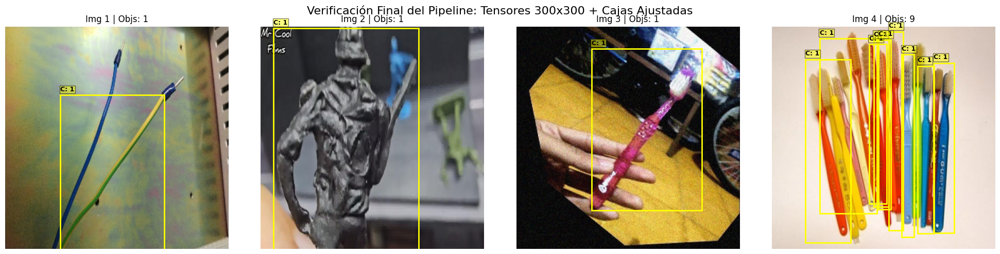

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
from torch.utils.data import DataLoader

# Aseguramos que usamos el dataset creado en la celda anterior
# Si por alguna razon se borró la variable, la recargamos:
if 'ds_prueba' not in locals():
    ds_prueba = ResiduosDetectionDataset(BASE_DIR, split='train')

# Configuracion del DataLoader para visualizacion
# IMPORTANTE: Usamos collate_fn porque las imagenes tienen distinto numero de cajas
batch_size_vis = 4
loader = DataLoader(ds_prueba, batch_size=batch_size_vis, shuffle=True, collate_fn=collate_fn)

# Obtener un solo batch
# batch_imgs es una tupla de tensores
# batch_targets es una lista de diccionarios
try:
    batch_imgs, batch_targets = next(iter(loader))
    print(f"Batch cargado exitosamente.")
    print(f"Estructura Imagenes: {type(batch_imgs)} de longitud {len(batch_imgs)}")
    print(f"Estructura Targets: {type(batch_targets)} de longitud {len(batch_targets)}")
except Exception as e:
    print(f"Error al cargar el batch: {e}")
    batch_imgs = []

if len(batch_imgs) > 0:
    # Crear figura
    fig, axs = plt.subplots(1, batch_size_vis, figsize=(20, 5))
    fig.suptitle(f"Verificación Final del Pipeline: Tensores {TARGET_SIZE}x{TARGET_SIZE} + Cajas Ajustadas", fontsize=16)

    for i in range(batch_size_vis):
        ax = axs[i] if batch_size_vis > 1 else axs

        # 1. Recuperar imagen del tensor (C, H, W) -> (H, W, C)
        # Como los tensores son float 0-1, matplotlib los lee directo
        img_tensor = batch_imgs[i]
        img_np = img_tensor.permute(1, 2, 0).cpu().numpy()

        # Mostrar imagen
        ax.imshow(img_np)

        # 2. Recuperar y dibujar cajas
        targets = batch_targets[i]
        boxes = targets['boxes'].cpu()
        labels = targets['labels'].cpu()

        for box, label in zip(boxes, labels):
            x_min, y_min, x_max, y_max = box.numpy()

            w = x_max - x_min
            h = y_max - y_min

            # Dibujar rectangulo (Yellow para contraste sobre foto real)
            rect = patches.Rectangle(
                (x_min, y_min), w, h,
                linewidth=2, edgecolor='yellow', facecolor='none'
            )
            ax.add_patch(rect)

            # Poner el ID de la clase
            ax.text(
                x_min, y_min - 5,
                f"C: {int(label)}",
                color='black', fontsize=9, fontweight='bold',
                bbox=dict(facecolor='yellow', alpha=0.5, pad=1)
            )

        ax.axis('off')
        ax.set_title(f"Img {i+1} | Objs: {len(boxes)}")

    plt.tight_layout()
    plt.show()

# FASE 3: DEFINIENDO EL MODELO

In [4]:
# --- CELDA 9: Configuración de Hiperparámetros (Estrategia Grid) ---
import torch

# 1. Configuración del Dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. Hiperparámetros de Entrada
IMG_SIZE = 300       # Resolución de entrada
IN_CHANNELS = 3      # RGB

# 3. Hiperparámetros de Arquitectura (Fast R-CNN)
BACKBONE_OUT_CHANNELS = 512 # VGG Style personalizado
NUM_CLASSES = 6             # 5 Clases + Fondo

# 4. Configuración de GRID PROPOSALS (El reemplazo robusto de SS)
# Estos valores definen cómo creamos las cajas "ciegas"
GRID_STEP = 32              # Cada cuántos píxeles ponemos una caja
GRID_BOX_SIZES = [64, 128, 256] # Tamaños de las cajas (Pequeño, Mediano, Grande)

print(f"--- CONFIGURACIÓN ACTUALIZADA (GRID STRATEGY) ---")
print(f"Device: {device}")
print(f"Backbone Channels: {BACKBONE_OUT_CHANNELS}")
print(f"Estrategia de Propuestas: Grid (Step={GRID_STEP}, Sizes={GRID_BOX_SIZES})")

--- CONFIGURACIÓN ACTUALIZADA (GRID STRATEGY) ---
Device: cuda
Backbone Channels: 512
Estrategia de Propuestas: Grid (Step=32, Sizes=[64, 128, 256])


Analizando imagen 35301...
La estrategia Grid genera 104 cajas fijas por imagen.


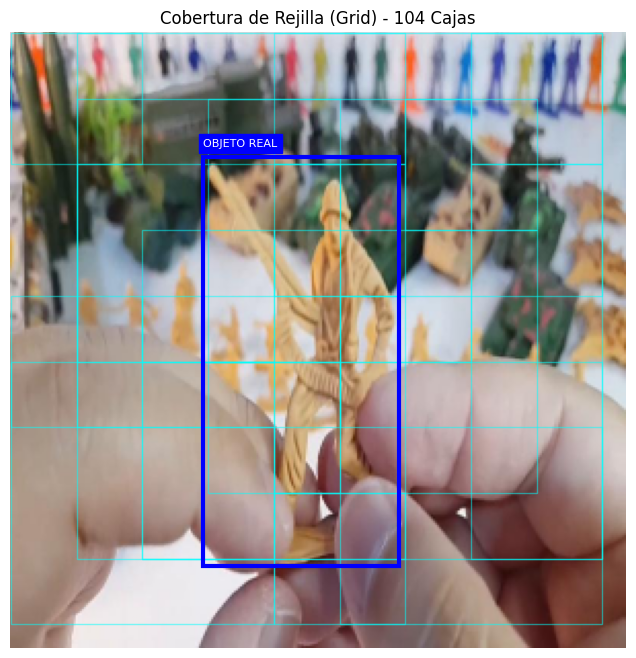

In [ ]:
# --- CELDA 10: Visualización de Propuestas (Grid Coverage) ---
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import random
import torch

# Función temporal para visualizar la rejilla (La definitiva estará en Celda 11)
def preview_grid_proposals(img_size, step, sizes):
    proposals = []
    for y in range(0, img_size, step):
        for x in range(0, img_size, step):
            for size in sizes:
                if (x+size <= img_size) and (y+size <= img_size):
                    proposals.append([x, y, x+size, y+size])
    return proposals

def visualizar_grid_strategy(dataset):
    if len(dataset) == 0: return

    # Tomar imagen aleatoria
    idx = random.randint(0, len(dataset) - 1)
    img_tensor, target = dataset[idx]

    # Preparar imagen
    img_np = img_tensor.permute(1, 2, 0).numpy()

    # Generar rejilla
    grid_boxes = preview_grid_proposals(IMG_SIZE, GRID_STEP, GRID_BOX_SIZES)

    print(f"Analizando imagen {idx}...")
    print(f"La estrategia Grid genera {len(grid_boxes)} cajas fijas por imagen.")

    # Plot
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.imshow(img_np)
    ax.set_title(f"Cobertura de Rejilla (Grid) - {len(grid_boxes)} Cajas")

    # Dibujar solo una muestra de la rejilla para no tapar todo (ej. 1 de cada 5)
    for i, box in enumerate(grid_boxes):
        if i % 5 == 0:
            rect = patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1],
                                   linewidth=1, edgecolor='cyan', facecolor='none', alpha=0.5)
            ax.add_patch(rect)

    # Dibujar GT (Lo que queremos encontrar)
    gt_boxes = target['boxes']
    for box in gt_boxes:
        rect = patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1],
                               linewidth=3, edgecolor='blue', facecolor='none')
        ax.add_patch(rect)
        ax.text(box[0], box[1]-5, "OBJETO REAL", color='white', backgroundcolor='blue', fontsize=8)

    plt.axis('off')
    plt.show()

# Ejecutar visualización
if 'ds_prueba' in locals():
    visualizar_grid_strategy(ds_prueba)
else:
    print("Ejecuta la Celda 7 (Dataset) primero.")

Descripción del Componente: Esta celda contiene las utilidades matemáticas esenciales. Se añade una nueva función crítica: generate_grid_proposals. Esta función crea mecánicamente miles de cajas de diferentes tamaños (64, 128, 256) distribuidas uniformemente sobre la imagen de 300x300. Esto reemplaza a Selective Search para garantizar una cobertura espacial del 100% y capturar objetos pequeños o de bajo contraste.

In [5]:
# --- CELDA 11: Utilidades Matemáticas y Generador de Rejilla ---
import torch
import numpy as np

# 1. Generador de Propuestas por Rejilla (Grid Proposals)
def generate_grid_proposals(image_size=300, step=32, box_sizes=[64, 128, 256]):
    # Genera anclas fijas cubriendo toda la imagen
    proposals = []
    # Barrido en X e Y
    for y in range(0, image_size, step):
        for x in range(0, image_size, step):
            for size in box_sizes:
                # Crear caja cuadrada centrada en x,y
                x1 = x
                y1 = y
                x2 = x + size
                y2 = y + size

                # Recortar si se sale de la imagen
                x2 = min(x2, image_size)
                y2 = min(y2, image_size)

                # Evitar cajas degeneradas o muy pequeñas
                if (x2 - x1 > 10) and (y2 - y1 > 10):
                    proposals.append([x1, y1, x2, y2])

    return torch.tensor(proposals, dtype=torch.float32)

# 2. Utilitarios de IoU y Codificación (Idénticos a versión previa)
def get_iou_matrix(boxes1, boxes2):
    area1 = (boxes1[:, 2] - boxes1[:, 0]) * (boxes1[:, 3] - boxes1[:, 1])
    area2 = (boxes2[:, 2] - boxes2[:, 0]) * (boxes2[:, 3] - boxes2[:, 1])
    lt = torch.max(boxes1[:, None, :2], boxes2[:, :2])
    rb = torch.min(boxes1[:, None, 2:], boxes2[:, 2:])
    wh = (rb - lt).clamp(min=0)
    inter = wh[:, :, 0] * wh[:, :, 1]
    union = area1[:, None] + area2 - inter
    return inter / (union + 1e-6)

def encode_deltas(src_boxes, tgt_boxes):
    w = src_boxes[:, 2] - src_boxes[:, 0] + 1e-6
    h = src_boxes[:, 3] - src_boxes[:, 1] + 1e-6
    cx = src_boxes[:, 0] + 0.5 * w
    cy = src_boxes[:, 1] + 0.5 * h
    gt_w = tgt_boxes[:, 2] - tgt_boxes[:, 0]
    gt_h = tgt_boxes[:, 3] - tgt_boxes[:, 1]
    gt_cx = tgt_boxes[:, 0] + 0.5 * gt_w
    gt_cy = tgt_boxes[:, 1] + 0.5 * gt_h
    dx = (gt_cx - cx) / w
    dy = (gt_cy - cy) / h
    dw = torch.log(gt_w / w + 1e-6)
    dh = torch.log(gt_h / h + 1e-6)
    return torch.stack([dx, dy, dw, dh], dim=1)

def decode_deltas(deltas, boxes):
    w = boxes[:, 2] - boxes[:, 0]
    h = boxes[:, 3] - boxes[:, 1]
    cx = boxes[:, 0] + 0.5 * w
    cy = boxes[:, 1] + 0.5 * h
    dx, dy, dw, dh = deltas[:, 0], deltas[:, 1], deltas[:, 2], deltas[:, 3]
    pred_cx = dx * w + cx
    pred_cy = dy * h + cy
    pred_w = torch.exp(dw) * w
    pred_h = torch.exp(dh) * h
    return torch.stack([pred_cx - 0.5*pred_w, pred_cy - 0.5*pred_h,
                        pred_cx + 0.5*pred_w, pred_cy + 0.5*pred_h], dim=1)

Descripción del Componente: Esta celda define el FeatureExtractor, el componente más pesado de la red. Es una Red Neuronal Convolucional (CNN) personalizada estilo VGG, diseñada específicamente para entrenar desde cero (from scratch). Su función es transformar la imagen bruta (300x300x3) en un mapa de características denso (aprox. 18x18x512). Utiliza normalización por lotes (BatchNorm) e inicialización Kaiming para garantizar que los gradientes fluyan correctamente durante el entrenamiento sin pesos pre-entrenados.

In [6]:
# --- CELDA 12: Backbone Extractor (VGG Style 512) ---
import torch.nn as nn

class FeatureExtractor(nn.Module):
    def __init__(self):
        super(FeatureExtractor, self).__init__()
        self.block1 = nn.Sequential(nn.Conv2d(3,64,3,1,1), nn.BatchNorm2d(64), nn.ReLU(), nn.Conv2d(64,64,3,1,1), nn.BatchNorm2d(64), nn.ReLU(), nn.MaxPool2d(2))
        self.block2 = nn.Sequential(nn.Conv2d(64,128,3,1,1), nn.BatchNorm2d(128), nn.ReLU(), nn.Conv2d(128,128,3,1,1), nn.BatchNorm2d(128), nn.ReLU(), nn.MaxPool2d(2))
        self.block3 = nn.Sequential(nn.Conv2d(128,256,3,1,1), nn.BatchNorm2d(256), nn.ReLU(), nn.Conv2d(256,256,3,1,1), nn.BatchNorm2d(256), nn.ReLU(), nn.MaxPool2d(2))
        self.block4 = nn.Sequential(nn.Conv2d(256,512,3,1,1), nn.BatchNorm2d(512), nn.ReLU(), nn.Conv2d(512,512,3,1,1), nn.BatchNorm2d(512), nn.ReLU(), nn.MaxPool2d(2))
        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d): nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d): nn.init.constant_(m.weight, 1); nn.init.constant_(m.bias, 0)

    def forward(self, x): return self.block4(self.block3(self.block2(self.block1(x))))

Descripción del Componente: Esta celda implementa la capa intermedia StandardROIAlign. Es el puente crucial entre las propuestas variables de Selective Search y el clasificador de tamaño fijo. Utiliza interpolación bilineal para mapear cualquier región rectangular del mapa de características a un tensor fijo de 7x7 píxeles, preservando la información espacial exacta sin las distorsiones del pooling tradicional.

In [7]:
# --- CELDA 13: Capa RoI Align ---
import torchvision.ops as ops

class StandardROIAlign(nn.Module):
    def __init__(self, output_size=(7, 7), spatial_scale=1.0/16.0):
        super(StandardROIAlign, self).__init__()
        # output_size: Dimension de salida para las capas lineales
        # spatial_scale: Factor de reduccion (300px input / 16 = 18.75 feature map)
        self.roi_align = ops.RoIAlign(
            output_size=output_size,
            spatial_scale=spatial_scale,
            sampling_ratio=2
        )

    def forward(self, features, rois):
        # features: [Batch, 512, H, W]
        # rois: [K, 5] (idx, x1, y1, x2, y2)
        return self.roi_align(features, rois)

Descripción del Componente: Esta celda define el FastRCNNHead, el "cerebro" final del modelo. Recibe los vectores de características aplanados (512x7x7) y los procesa mediante capas totalmente conectadas (FC). Incorpora Dropout (tasa 0.5) para prevenir el sobreajuste, algo vital dado el tamaño del dataset. Produce dos salidas simultáneas: un vector de probabilidad de clase (cls_score) y los deltas de ajuste de coordenadas (bbox_pred).

In [8]:
# --- CELDA 14: Head ---
class FastRCNNHead(nn.Module):
    def __init__(self, in_channels, roi_size, num_classes):
        super(FastRCNNHead, self).__init__()
        self.fc_input_dim = in_channels * roi_size[0] * roi_size[1]
        self.classifier = nn.Sequential(
            nn.Linear(self.fc_input_dim, 4096), nn.ReLU(True), nn.Dropout(0.5),
            nn.Linear(4096, 4096), nn.ReLU(True), nn.Dropout(0.5)
        )
        self.cls_score = nn.Linear(4096, num_classes)
        self.bbox_pred = nn.Linear(4096, num_classes * 4)
        self._init_weights()

    def _init_weights(self):
        for m in self.classifier.modules():
            if isinstance(m, nn.Linear): nn.init.normal_(m.weight, 0, 0.01); nn.init.constant_(m.bias, 0)
        nn.init.normal_(self.cls_score.weight, 0, 0.01); nn.init.constant_(self.cls_score.bias, 0)
        nn.init.normal_(self.bbox_pred.weight, 0, 0.001); nn.init.constant_(self.bbox_pred.bias, 0)

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return self.cls_score(x), self.bbox_pred(x)

Descripción del Componente: Esta celda ensambla la arquitectura completa. La clase FastRCNN integra el Backbone, el RoI Align y el Head en un solo flujo de trabajo. Su método forward orquesta el paso de la imagen por el extractor, el recorte de características basado en las propuestas de Selective Search y la predicción final. Es el objeto que se instanciará para el entrenamiento.

In [9]:
# --- CELDA 15: Ensamblaje Fast R-CNN ---
class FastRCNN(nn.Module):
    def __init__(self, num_classes):
        super(FastRCNN, self).__init__()
        self.roi_size = (7, 7)
        self.backbone = FeatureExtractor()
        self.roi_layer = StandardROIAlign(self.roi_size)
        self.head = FastRCNNHead(512, self.roi_size, num_classes)

    def forward(self, images, rois):
        # 1. Backbone
        feature_map = self.backbone(images)
        # 2. RoI Pooling
        pool_feats = self.roi_layer(feature_map, rois)
        # 3. Head
        scores, deltas = self.head(pool_feats)
        return scores, deltas

# Fase 4: Pruebas y Verificación de Aprendizaje

In [ ]:
# --- CELDA 16: Test de Dimensiones (Sanity Check) ---
import torch

def test_fast_rcnn_dimensions():
    # Configuracion de la prueba
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    num_classes = 6  # 5 clases reales + 1 fondo
    num_rois = 10    # Simulamos 10 propuestas de cajas

    print(f"--- Iniciando Test de Dimensiones (Dispositivo: {device}) ---")

    # 1. Instanciar el modelo definido en la Fase 3
    try:
        model = FastRCNN(num_classes=num_classes)
        model.to(device)
        model.eval()
    except NameError:
        print("Error: La clase FastRCNN no está definida. Ejecuta las celdas de la Fase 3.")
        return

    # 2. Generar Datos Sintéticos
    # Imagen simulada: [Batch=1, Canales=3, Alto=300, Ancho=300]
    dummy_img = torch.randn(1, 3, 300, 300).to(device)

    # Propuestas simuladas (ROIs): [K, 5] -> (batch_idx, x1, y1, x2, y2)
    # batch_idx es 0 porque solo tenemos 1 imagen
    dummy_rois = torch.zeros((num_rois, 5)).to(device)

    # Coordenadas aleatorias simples (x1, y1, x2, y2)
    dummy_rois[:, 1] = torch.rand(num_rois) * 100       # x1
    dummy_rois[:, 2] = torch.rand(num_rois) * 100       # y1
    dummy_rois[:, 3] = dummy_rois[:, 1] + 50            # x2
    dummy_rois[:, 4] = dummy_rois[:, 2] + 50            # y2

    print(f"Entrada Imagen: {dummy_img.shape}")
    print(f"Entrada ROIs: {dummy_rois.shape}")

    # 3. Ejecutar Forward Pass
    try:
        with torch.no_grad():
            scores, deltas = model(dummy_img, dummy_rois)

        # 4. Verificación de Salidas
        print(f"Salida Scores: {scores.shape}")
        print(f"Salida Deltas: {deltas.shape}")

        # Validaciones logicas
        expected_scores = (num_rois, num_classes)
        expected_deltas = (num_rois, num_classes * 4)

        if scores.shape == expected_scores and deltas.shape == expected_deltas:
            print("[OK] Prueba de Dimensiones APROBADA.")
        else:
            print(f"[FALLO] Dimensiones incorrectas. Esperado Scores: {expected_scores}, Deltas: {expected_deltas}")

    except Exception as e:
        print(f"[ERROR CRITICO] El modelo falló durante la ejecución: {e}")

# Ejecutar el test
test_fast_rcnn_dimensions()

--- Iniciando Test de Dimensiones (Dispositivo: cuda) ---
Entrada Imagen: torch.Size([1, 3, 300, 300])
Entrada ROIs: torch.Size([10, 5])
Salida Scores: torch.Size([10, 6])
Salida Deltas: torch.Size([10, 24])
[OK] Prueba de Dimensiones APROBADA.


FIT DE UNA MUESTRA

Datos preparados: 64 ROIs (16 Pos, 48 Neg)
Iniciando entrenamiento (50 epocas)...
Epoca 10 | Loss: 0.4772 | Acc: 84.4%
Epoca 20 | Loss: 0.1688 | Acc: 95.3%
Epoca 30 | Loss: 0.0678 | Acc: 96.9%
Epoca 40 | Loss: 0.0422 | Acc: 98.4%
Epoca 50 | Loss: 0.0083 | Acc: 100.0%


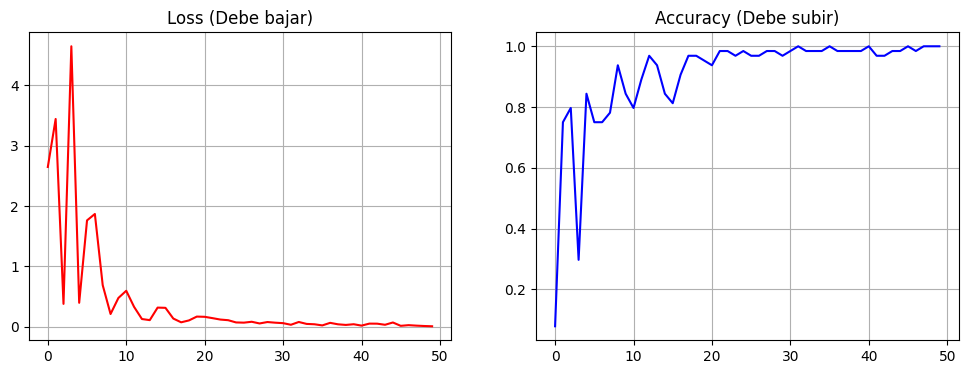

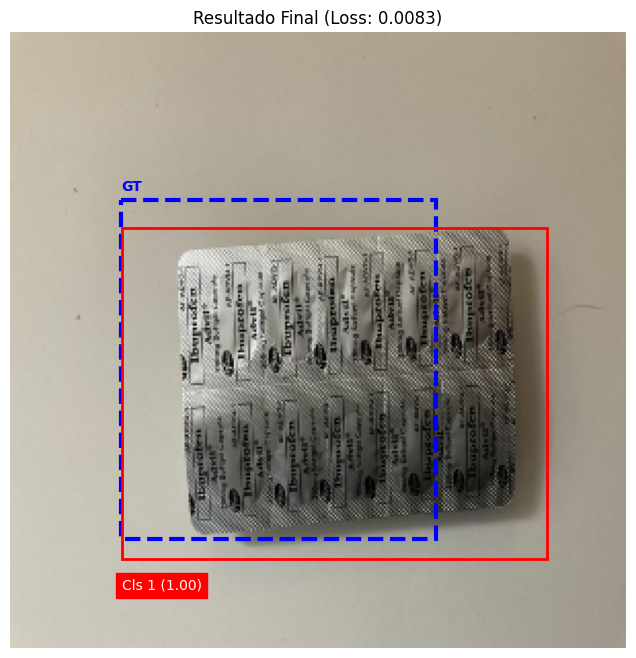

In [ ]:
# --- CELDA 17: PRUEBA DE OVERFITTING (GRID STRATEGY) ---
import torch
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision.ops as ops
import numpy as np

# Configuracion
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
TARGET_SIZE = 300

print("--- PRUEBA DE OVERFITTING (50 ÉPOCAS EN 1 IMAGEN) ---")

# 1. Preparacion de Datos (Usamos full_ds actual)
if 'full_ds' not in locals():
    print("Error: 'full_ds' no está definido. Ejecuta la Celda 21/22 primero.")
else:
    # Obtener una imagen válida (que tenga objetos)
    sample_img, sample_gt_boxes, sample_gt_labels = None, None, None

    for i in range(len(full_ds)):
        img, tgt = full_ds[i]
        if len(tgt['boxes']) > 0:
            sample_img = img.unsqueeze(0).to(DEVICE) # [1, 3, H, W]
            sample_gt_boxes = tgt['boxes'].to(DEVICE)
            sample_gt_labels = tgt['labels'].to(DEVICE)
            break

    if sample_img is None:
        print("Error: No se encontraron imágenes con anotaciones en el dataset.")
    else:
        # A. Generar Grid + Inyectar Ground Truth (Para asegurar convergencia)
        # Esto garantiza que al menos haya cajas perfectas para aprender
        base_grid = generate_grid_proposals(300).to(DEVICE)
        all_rois = torch.cat([sample_gt_boxes, base_grid], dim=0) # [N, 4]

        # B. Matching (IoU)
        ious = get_iou_matrix(all_rois, sample_gt_boxes)
        max_iou, gt_indices = ious.max(dim=1)

        # C. Filtrado Positivos/Negativos
        pos_mask = max_iou >= 0.5
        neg_mask = (max_iou < 0.5) & (max_iou >= 0.1)

        pos_idxs = torch.where(pos_mask)[0]
        neg_idxs = torch.where(neg_mask)[0]

        # D. Sampling (Forzamos un batch pequeño balanceado)
        # Tomamos hasta 16 positivos y completamos hasta 64 con negativos
        if len(pos_idxs) > 0:
            num_pos = min(16, len(pos_idxs))
            num_neg = 64 - num_pos
            if len(neg_idxs) < num_neg: num_neg = len(neg_idxs)

            keep_pos = pos_idxs[torch.randperm(len(pos_idxs))[:num_pos]]
            keep_neg = neg_idxs[torch.randperm(len(neg_idxs))[:num_neg]]
            keep_idxs = torch.cat([keep_pos, keep_neg])

            # Construir Tensor de ROIs para el modelo [Batch_Index, x1, y1, x2, y2]
            rois_data = all_rois[keep_idxs]
            train_rois = torch.zeros((len(rois_data), 5)).to(DEVICE)
            train_rois[:, 1:] = rois_data # Batch index 0

            # Construir Targets
            target_labels = torch.zeros(len(keep_idxs), dtype=torch.long).to(DEVICE)
            target_labels[:num_pos] = sample_gt_labels[gt_indices[keep_pos]]

            target_deltas = torch.zeros((len(keep_idxs), 4)).to(DEVICE)
            target_deltas[:num_pos] = encode_deltas(rois_data[:num_pos], sample_gt_boxes[gt_indices[keep_pos]])

            print(f"Datos preparados: {len(train_rois)} ROIs ({num_pos} Positivos, {num_neg} Negativos)")

            # 2. Bucle de Entrenamiento (50 Epocas)
            model = FastRCNN(num_classes=6).to(DEVICE)
            model.train()
            optimizer = optim.Adam(model.parameters(), lr=1e-4)

            loss_history = []
            acc_history = []

            print("Entrenando...")
            for epoch in range(50):
                optimizer.zero_grad()
                scores, pred_deltas = model(sample_img, train_rois)

                # Loss Clasificación
                cls_loss = F.cross_entropy(scores, target_labels)

                # Loss Regresión
                reg_loss = torch.tensor(0.0).to(DEVICE)
                if num_pos > 0:
                    pos_deltas = pred_deltas[:num_pos].view(num_pos, 6, 4)
                    deltas_to_penalize = pos_deltas[torch.arange(num_pos), target_labels[:num_pos]]
                    reg_loss = F.smooth_l1_loss(deltas_to_penalize, target_deltas[:num_pos])

                total_loss = cls_loss + reg_loss
                total_loss.backward()
                optimizer.step()

                # Métricas
                with torch.no_grad():
                    preds = scores.argmax(dim=1)
                    acc = (preds == target_labels).float().mean()
                    acc_history.append(acc.item())

                loss_history.append(total_loss.item())

                if (epoch+1) % 10 == 0:
                    print(f"Epoca {epoch+1} | Loss: {total_loss.item():.4f} | Acc: {acc.item()*100:.1f}%")

            # 3. Graficas
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
            ax1.plot(loss_history, 'r-'); ax1.set_title("Loss"); ax1.grid(True)
            ax2.plot(acc_history, 'b-'); ax2.set_title("Accuracy"); ax2.grid(True)
            plt.show()

            # 4. Visualizacion Final (Inferencia)
            model.eval()
            with torch.no_grad():
                # Pasamos los mismos ROIs de entrenamiento para ver si los aprendió
                scores, deltas = model(sample_img, train_rois)
                probs = F.softmax(scores, dim=1)

                # Obtener clase y score máximo
                all_scores, all_classes = probs[:, 1:].max(dim=1)
                all_classes = all_classes + 1 # Ajustar índice (0 es background)

                # Filtrar umbral bajo para ver si detecta algo
                keep = all_scores > 0.3

                if keep.sum() > 0:
                    boxes = train_rois[keep, 1:]
                    sc = all_scores[keep]
                    cl = all_classes[keep]

                    # Aplicar NMS
                    keep_nms = ops.nms(boxes, sc, 0.3)
                    final_boxes = boxes[keep_nms]
                    final_scores = sc[keep_nms]
                    final_classes = cl[keep_nms]

                    # Plot
                    img_np = sample_img[0].cpu().permute(1, 2, 0).numpy()
                    # Desnormalizar si fuera necesario, aquí asumimos [0,1] o estandar
                    # Si la imagen se ve oscura/rara es por la normalización, pero las cajas importan más

                    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
                    ax.imshow(img_np)

                    # Dibujar Ground Truth (Azul)
                    for box in sample_gt_boxes:
                        b = box.cpu().numpy()
                        rect = patches.Rectangle((b[0], b[1]), b[2]-b[0], b[3]-b[1], linewidth=2, edgecolor='blue', facecolor='none')
                        ax.add_patch(rect)
                        ax.text(b[0], b[1], "GT", color='blue', fontsize=8)

                    # Dibujar Predicciones (Rojo)
                    for i in range(len(final_boxes)):
                        b = final_boxes[i].cpu().numpy()
                        rect = patches.Rectangle((b[0], b[1]), b[2]-b[0], b[3]-b[1], linewidth=2, edgecolor='red', facecolor='none')
                        ax.add_patch(rect)
                        ax.text(b[0], b[3], f"{final_classes[i].item()} ({final_scores[i]:.2f})", color='red', fontsize=8)

                    plt.title("Azul: Real | Rojo: Predicción (Overfitting)")
                    plt.show()
                else:
                    print("El modelo no generó predicciones > 0.3")

        else:
            print("No se encontraron ROIs positivos en esta imagen para entrenar.")

FIT DE UN BATCH

Lote cargado: 4 imágenes.
Entrenando con 512 ROIs totales.
Iniciando ajuste (60 épocas)...
Ep 20 | Loss: 0.4424 | Acc: 98.4%
Ep 40 | Loss: 0.3605 | Acc: 100.0%
Ep 60 | Loss: 0.3357 | Acc: 100.0%
Visualizando...


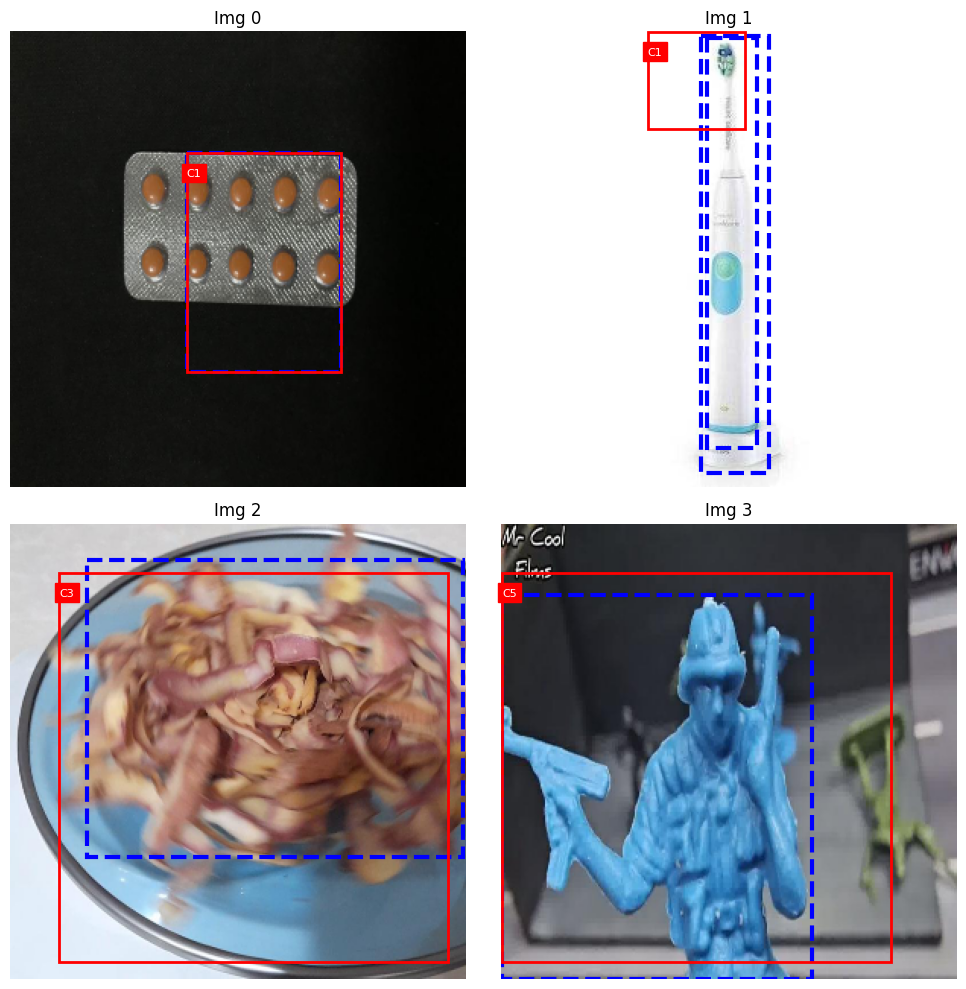

In [ ]:
# --- CELDA 18: Prueba de Fit One Batch (4 Imágenes) ---
import torch
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from torch.utils.data import DataLoader

# Configuracion
device = torch.device("cpu") # CPU para ver errores claros
BATCH_SIZE = 4
EPOCHS = 60

def collate_fn(batch): return tuple(zip(*batch))

# 1. Cargar el Batch usando tu Dataset (Celda 7)
if 'ResiduosDetectionDataset' not in locals():
    print("Error Crítico: No has ejecutado la Celda 7 (Clase Dataset).")
else:
    # Instanciamos dataset y loader
    ds_prueba = ResiduosDetectionDataset(BASE_DIR, split='train')
    train_loader = DataLoader(ds_prueba, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)

    # Obtener un solo batch fijo
    data_iter = iter(train_loader)
    try:
        images_batch, targets_batch = next(data_iter)
        print(f"Lote cargado: {len(images_batch)} imágenes.")
    except StopIteration:
        print("Error: Dataset vacío o ruta incorrecta.")
        images_batch = []

    if len(images_batch) == BATCH_SIZE:
        # 2. Preparar ROIs (Estrategia Grid + GT)
        # Requiere generate_grid_proposals (Celda 11)
        base_grid = generate_grid_proposals(300).to(device)
        stacked_images = torch.stack(images_batch).to(device)

        all_rois_list = []; all_labels_list = []; all_deltas_list = []

        for i in range(BATCH_SIZE):
            gt_boxes = targets_batch[i]['boxes'].to(device)
            gt_labels = targets_batch[i]['labels'].to(device)

            # Inyección de GT
            if len(gt_boxes) > 0:
                combined_rois = torch.cat([gt_boxes, base_grid], dim=0)
            else:
                combined_rois = base_grid

            # Matching (Requiere get_iou_matrix - Celda 11)
            rois_labels = torch.zeros(len(combined_rois), dtype=torch.long).to(device)
            rois_deltas = torch.zeros((len(combined_rois), 4)).to(device)

            if len(gt_boxes) > 0:
                ious = get_iou_matrix(combined_rois, gt_boxes)
                max_iou, gt_idx = ious.max(dim=1)

                # Positivos si IoU > 0.5
                pos_mask = max_iou >= 0.5
                rois_labels[pos_mask] = gt_labels[gt_idx[pos_mask]]

                if pos_mask.sum() > 0:
                    src = combined_rois[pos_mask]
                    tgt = gt_boxes[gt_idx[pos_mask]]
                    # Requiere encode_deltas (Celda 11)
                    rois_deltas[pos_mask] = encode_deltas(src, tgt)

            # Sampling (Balanceo)
            pos_idxs = torch.where(rois_labels > 0)[0]
            neg_idxs = torch.where(rois_labels == 0)[0]

            num_pos = min(32, len(pos_idxs))
            num_neg = 128 - num_pos

            if len(pos_idxs) > 0:
                pos_idxs = pos_idxs[torch.randperm(len(pos_idxs))[:num_pos]]
            if len(neg_idxs) > 0:
                neg_idxs = neg_idxs[torch.randperm(len(neg_idxs))[:num_neg]]

            keep = torch.cat([pos_idxs, neg_idxs])

            # Guardar con índice de batch
            final_rois = combined_rois[keep]
            rois_with_idx = torch.zeros((len(final_rois), 5)).to(device)
            rois_with_idx[:, 0] = i # Índice del batch
            rois_with_idx[:, 1:] = final_rois

            all_rois_list.append(rois_with_idx)
            all_labels_list.append(rois_labels[keep])
            all_deltas_list.append(rois_deltas[keep])

        # Concatenar tensores del batch
        train_rois = torch.cat(all_rois_list, dim=0)
        train_labels = torch.cat(all_labels_list, dim=0)
        train_deltas = torch.cat(all_deltas_list, dim=0)

        print(f"Entrenando con {len(train_rois)} ROIs totales.")

        # 3. Entrenamiento (Fit)
        # Requiere FastRCNN (Celda 15)
        model = FastRCNN(num_classes=6).to(device)
        model.train()
        optimizer = optim.Adam(model.parameters(), lr=1e-4)

        print(f"Iniciando ajuste ({EPOCHS} épocas)...")

        for epoch in range(EPOCHS):
            optimizer.zero_grad()
            scores, pred_deltas = model(stacked_images, train_rois)

            cls_loss = F.cross_entropy(scores, train_labels)

            pos_mask = train_labels > 0
            reg_loss = torch.tensor(0.0).to(device)
            if pos_mask.sum() > 0:
                pred_deltas_pos = pred_deltas[pos_mask].view(-1, 6, 4)
                labels_pos = train_labels[pos_mask]
                deltas_pred = pred_deltas_pos[torch.arange(len(labels_pos)), labels_pos]
                reg_loss = F.smooth_l1_loss(deltas_pred, train_deltas[pos_mask])

            total_loss = cls_loss + reg_loss
            total_loss.backward()
            optimizer.step()

            if (epoch+1) % 20 == 0:
                acc = (scores.argmax(dim=1) == train_labels).float().mean()
                print(f"Ep {epoch+1} | Loss: {total_loss.item():.4f} | Acc: {acc:.1%}")

        # 4. Visualización (Grid + GT para confirmar memorización)
        print("Visualizando...")
        model.train() # Mantener train stats

        fig, axes = plt.subplots(2, 2, figsize=(10, 10))
        axes = axes.flatten()

        for i in range(BATCH_SIZE):
            ax = axes[i]
            img_np = (images_batch[i].permute(1, 2, 0).numpy() * 255).astype(np.uint8)
            ax.imshow(img_np)

            gt = targets_batch[i]['boxes'].to(device)

            # A. Dibujar GT (Azul)
            if len(gt) > 0:
                for b in gt:
                    rect = patches.Rectangle((b[0].cpu(), b[1].cpu()), b[2].cpu()-b[0].cpu(), b[3].cpu()-b[1].cpu(),
                                           lw=3, ec='blue', fc='none', linestyle='--')
                    ax.add_patch(rect)
            else:
                ax.text(10, 10, "SIN GT", color='white', backgroundcolor='black')

            # B. Predicción (Usando Grid + GT para asegurar coincidencia visual si aprendió)
            base_grid_vis = generate_grid_proposals(300).to(device)
            if len(gt) > 0:
                vis_rois = torch.cat([gt, base_grid_vis], dim=0)
            else:
                vis_rois = base_grid_vis

            # Formato batch para forward (solo esta imagen)
            rois_input = torch.zeros((len(vis_rois), 5)).to(device)
            rois_input[:, 0] = 0
            rois_input[:, 1:] = vis_rois

            img_tensor = stacked_images[i].unsqueeze(0)

            with torch.no_grad():
                scores, deltas = model(img_tensor, rois_input)
                probs = F.softmax(scores, dim=1)

                all_scores = probs[:, 1:].max(dim=1)[0]
                all_classes = probs[:, 1:].argmax(dim=1) + 1

                keep = all_scores > 0.5
                if keep.sum() > 0:
                    # Requiere decode_deltas (Celda 11)
                    boxes_keep = rois_input[keep, 1:]
                    scores_keep = all_scores[keep]
                    classes_keep = all_classes[keep]

                    # NMS simple
                    # Requiere ops.nms (torchvision)
                    keep_nms = ops.nms(boxes_keep, scores_keep, 0.3)
                    final_boxes = boxes_keep[keep_nms]
                    final_scores = scores_keep[keep_nms]
                    final_classes = classes_keep[keep_nms]

                    for k in range(len(final_boxes)):
                        b = final_boxes[k]
                        rect = patches.Rectangle((b[0].cpu(), b[1].cpu()), b[2].cpu()-b[0].cpu(), b[3].cpu()-b[1].cpu(),
                                               lw=2, ec='red', fc='none')
                        ax.add_patch(rect)
                        ax.text(b[0].cpu(), b[1].cpu()+15, f"C{final_classes[k]}", color='white', backgroundcolor='red', fontsize=8)

            ax.axis('off')
            ax.set_title(f"Img {i}")

        plt.tight_layout()
        plt.show()
    else:
        print("Error: No se pudo cargar el batch completo.")

In [ ]:
# --- CELDA 19: Preparación del Subset para HParam Search ---
import torch
from torch.utils.data import DataLoader, random_split, Subset
import numpy as np
import os

# --- CONFIGURACIÓN DE SUBSET ---
SUBSET_SIZE = 1000      # Muestra representativa para pruebas rápidas
VAL_SUBSET_SPLIT = 0.2  # 20% para validación (800 Train / 200 Val)
HPARAM_BATCH_SIZE = 4   # Batch size conservador para evitar OOM en GPU
BASE_DIR = '/content/drive/MyDrive/Dataset Oficial'

def collate_fn(batch):
    return tuple(zip(*batch))

print(f"--- Iniciando partición de datos para Búsqueda de Hiperparámetros ---")

# 1. Instanciar el Dataset Completo
# Se asume que la clase ResiduosDetectionDataset ya fue definida en la Fase 2/4
try:
    full_ds = ResiduosDetectionDataset(BASE_DIR, split='train')
except NameError:
    print("Error Crítico: La clase 'ResiduosDetectionDataset' no está definida en memoria.")
    print("Por favor, ejecuta la Celda 7 (reparada) antes de continuar.")
    full_ds = None

if full_ds:
    # Validar tamaño del dataset
    total_disponible = len(full_ds)
    if total_disponible < SUBSET_SIZE:
        print(f"Advertencia: El dataset solo tiene {total_disponible} imágenes. Se usarán todas.")
        actual_subset_size = total_disponible
    else:
        actual_subset_size = SUBSET_SIZE

    # 2. Selección de Índices Aleatorios (Determinista)
    # Usamos semilla 42 para que el subset sea siempre el mismo en cada ejecución
    total_indices = list(range(len(full_ds)))
    rng = np.random.default_rng(42)
    subset_indices = rng.choice(total_indices, size=actual_subset_size, replace=False)

    # 3. Crear el Subset Maestro
    subset_ds = Subset(full_ds, subset_indices)

    # 4. División Train/Validation
    val_size = int(actual_subset_size * VAL_SUBSET_SPLIT)
    train_size = actual_subset_size - val_size

    train_subset_ds, val_subset_ds = random_split(
        subset_ds,
        [train_size, val_size],
        generator=torch.Generator().manual_seed(42)
    )

    print(f"\n--- Resumen de Partición ---")
    print(f"Total imágenes en subset: {actual_subset_size}")
    print(f" > Entrenamiento (Train): {len(train_subset_ds)} imágenes")
    print(f" > Validación (Val):      {len(val_subset_ds)} imágenes")

    # 5. Generación de DataLoaders
    # num_workers=2 para carga paralela, pin_memory=True para acelerar transferencia a GPU
    train_subset_loader = DataLoader(
        train_subset_ds,
        batch_size=HPARAM_BATCH_SIZE,
        shuffle=True,
        num_workers=2,
        collate_fn=collate_fn,
        pin_memory=torch.cuda.is_available()
    )

    val_subset_loader = DataLoader(
        val_subset_ds,
        batch_size=HPARAM_BATCH_SIZE,
        shuffle=False,
        num_workers=2,
        collate_fn=collate_fn,
        pin_memory=torch.cuda.is_available()
    )

    print(f"\n[OK] DataLoaders listos. Batch Size: {HPARAM_BATCH_SIZE}")

--- Iniciando partición de datos para Búsqueda de Hiperparámetros ---

--- Resumen de Partición ---
Total imágenes en subset: 1000
 > Entrenamiento (Train): 800 imágenes
 > Validación (Val):      200 imágenes

[OK] DataLoaders listos. Batch Size: 4


--- Iniciando Búsqueda de Hiperparámetros (3 configs) ---

Probando: Config A (Baseline)...


Entrenando Config A (Baseline):   0%|          | 0/5 [00:00<?, ?it/s]


Probando: Config B (Adam Stable)...


Entrenando Config B (Adam Stable):   0%|          | 0/5 [00:00<?, ?it/s]


Probando: Config C (SGD High LR)...


Entrenando Config C (SGD High LR):   0%|          | 0/5 [00:00<?, ?it/s]


Generando gráficas comparativas...


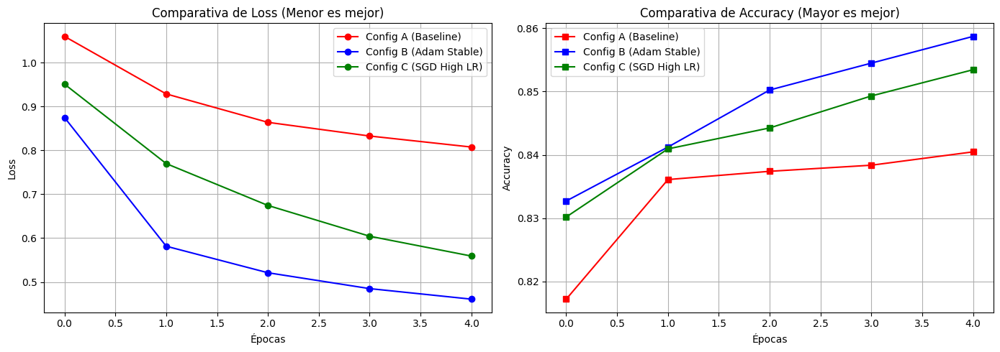

In [ ]:
# --- CELDA 20: Búsqueda de Hiperparámetros (Comparativa) ---
import torch
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import numpy as np

# --- CONFIGURACIÓN DEL EXPERIMENTO ---
EPOCHS_PER_CONFIG = 5  # Pocas épocas para iterar rápido
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Definición de las 3 combinaciones a probar
configs = [
    {
        "name": "Config A (Baseline)",
        "optimizer": "SGD",
        "lr": 0.001,
        "momentum": 0.9,
        "weight_decay": 0.0005
    },
    {
        "name": "Config B (Adam Stable)",
        "optimizer": "Adam",
        "lr": 0.0001, # Adam suele requerir LR más bajo
        "weight_decay": 0.0
    },
    {
        "name": "Config C (SGD High LR)",
        "optimizer": "SGD",
        "lr": 0.005,  # LR más agresivo
        "momentum": 0.9,
        "weight_decay": 0.0005
    }
]

# Historial para graficar
results = {cfg["name"]: {"loss": [], "acc": []} for cfg in configs}

# Pre-generar Grid Base (300x300)
base_grid = generate_grid_proposals(300).to(device)

print(f"--- Iniciando Búsqueda de Hiperparámetros ({len(configs)} configs) ---")

# --- BUCLE DE EXPERIMENTACIÓN ---
for cfg in configs:
    print(f"\nProbando: {cfg['name']}...")

    # 1. Reiniciar Modelo (Para empezar de cero en cada config)
    model = FastRCNN(num_classes=6).to(device)
    model.train()

    # 2. Configurar Optimizador
    if cfg["optimizer"] == "SGD":
        optimizer = optim.SGD(model.parameters(), lr=cfg["lr"],
                              momentum=cfg.get("momentum", 0),
                              weight_decay=cfg.get("weight_decay", 0))
    elif cfg["optimizer"] == "Adam":
        optimizer = optim.Adam(model.parameters(), lr=cfg["lr"],
                               weight_decay=cfg.get("weight_decay", 0))

    # 3. Bucle de Entrenamiento (Short)
    # Usamos tqdm para barra de progreso
    progress_bar = tqdm(range(EPOCHS_PER_CONFIG), desc=f"Entrenando {cfg['name']}")

    for epoch in progress_bar:
        epoch_loss = 0.0
        epoch_acc = 0.0
        batches = 0

        for images, targets in train_subset_loader:
            # A. Preparar Datos
            stacked_images = torch.stack(images).to(device)
            batch_size = len(images)

            all_rois = []
            all_labels = []
            all_deltas = []

            # B. Generar ROIs (Grid + GT) por imagen del batch
            for i in range(batch_size):
                gt_boxes = targets[i]['boxes'].to(device)
                gt_labels = targets[i]['labels'].to(device)

                # Grid + GT Strategy
                if len(gt_boxes) > 0:
                    combined_rois = torch.cat([gt_boxes, base_grid], dim=0)
                else:
                    combined_rois = base_grid

                # Matching
                rois_labels = torch.zeros(len(combined_rois), dtype=torch.long).to(device)
                rois_deltas = torch.zeros((len(combined_rois), 4)).to(device)

                if len(gt_boxes) > 0:
                    ious = get_iou_matrix(combined_rois, gt_boxes)
                    max_iou, gt_idx = ious.max(dim=1)

                    pos_mask = max_iou >= 0.5
                    rois_labels[pos_mask] = gt_labels[gt_idx[pos_mask]]

                    if pos_mask.sum() > 0:
                        src = combined_rois[pos_mask]
                        tgt = gt_boxes[gt_idx[pos_mask]]
                        rois_deltas[pos_mask] = encode_deltas(src, tgt)

                # Sampling (Light Balance para velocidad)
                pos_idxs = torch.where(rois_labels > 0)[0]
                neg_idxs = torch.where(rois_labels == 0)[0]

                # Submuestreo
                n_pos = min(16, len(pos_idxs))
                n_neg = 48 - n_pos

                if len(pos_idxs) > 0:
                    pos_idxs = pos_idxs[torch.randperm(len(pos_idxs))[:n_pos]]
                if len(neg_idxs) > 0:
                    neg_idxs = neg_idxs[torch.randperm(len(neg_idxs))[:n_neg]]

                keep = torch.cat([pos_idxs, neg_idxs])

                # Guardar tensores con índice de batch
                rois_with_idx = torch.zeros((len(keep), 5)).to(device)
                rois_with_idx[:, 0] = i # Batch Index
                rois_with_idx[:, 1:] = combined_rois[keep]

                all_rois.append(rois_with_idx)
                all_labels.append(rois_labels[keep])
                all_deltas.append(rois_deltas[keep])

            # Concatenar Batch
            train_rois = torch.cat(all_rois, dim=0)
            train_labels = torch.cat(all_labels, dim=0)
            train_deltas = torch.cat(all_deltas, dim=0)

            # C. Forward & Backward
            optimizer.zero_grad()
            scores, pred_deltas = model(stacked_images, train_rois)

            cls_loss = F.cross_entropy(scores, train_labels)

            pos_mask = train_labels > 0
            reg_loss = torch.tensor(0.0).to(device)
            if pos_mask.sum() > 0:
                pred_deltas_pos = pred_deltas[pos_mask].view(-1, 6, 4)
                labels_pos = train_labels[pos_mask]
                deltas_pred = pred_deltas_pos[torch.arange(len(labels_pos)), labels_pos]
                reg_loss = F.smooth_l1_loss(deltas_pred, train_deltas[pos_mask])

            loss = cls_loss + reg_loss
            loss.backward()

            # Clipping
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()

            # Métricas
            acc = (scores.argmax(dim=1) == train_labels).float().mean()

            epoch_loss += loss.item()
            epoch_acc += acc.item()
            batches += 1

            # Actualizar barra de progreso
            progress_bar.set_postfix({"Loss": f"{loss.item():.4f}", "Acc": f"{acc.item():.2%}"})

        # Fin de época
        avg_loss = epoch_loss / batches
        avg_acc = epoch_acc / batches
        results[cfg["name"]]["loss"].append(avg_loss)
        results[cfg["name"]]["acc"].append(avg_acc)

# --- GRAFICAR RESULTADOS ---
print("\nGenerando gráficas comparativas...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Colores para consistencia
colors = ['red', 'blue', 'green']

for i, cfg in enumerate(configs):
    name = cfg["name"]
    data = results[name]
    c = colors[i % len(colors)]

    # Gráfica Loss
    ax1.plot(data["loss"], label=name, marker='o', color=c)

    # Gráfica Accuracy
    ax2.plot(data["acc"], label=name, marker='s', color=c)

ax1.set_title("Comparativa de Loss (Menor es mejor)")
ax1.set_xlabel("Épocas")
ax1.set_ylabel("Loss")
ax1.grid(True)
ax1.legend()

ax2.set_title("Comparativa de Accuracy (Mayor es mejor)")
ax2.set_xlabel("Épocas")
ax2.set_ylabel("Accuracy")
ax2.grid(True)
ax2.legend()

plt.tight_layout()
plt.show()

# FASE 5 ENTRENAMIENTO

In [11]:
# --- CELDA 21: MIGRACIÓN ULTRA-RÁPIDA (MODO RAR) ---
import shutil
import os
import time
import sys

# 1. CONFIGURACIÓN
FILE_NAME = 'Dataset Oficial.rar'
RAR_SOURCE = f'/content/drive/MyDrive/{FILE_NAME}'
LOCAL_DEST_DIR = '/content/temp_dataset_local'

print(f"--- FASE 5.1: MIGRACIÓN DE DATOS (MODO RAR) ---")
print(f"Archivo Origen: {RAR_SOURCE}")

# 2. INSTALACIÓN DE UNRAR
print("[0/3] Instalando herramienta unrar...")
os.system("apt-get install unrar > /dev/null")

# 3. VERIFICACIÓN
if not os.path.exists(RAR_SOURCE):
    print(f"\n[ERROR CRÍTICO] No encuentro el archivo: {RAR_SOURCE}")
    sys.exit(1)

# 4. LIMPIEZA
if os.path.exists(LOCAL_DEST_DIR):
    shutil.rmtree(LOCAL_DEST_DIR)
os.makedirs(LOCAL_DEST_DIR, exist_ok=True)

try:
    start_total = time.time()

    # 5. COPIA
    print(f"[1/3] Copiando .rar al entorno local...")
    local_rar = os.path.join(LOCAL_DEST_DIR, 'temp_dataset.rar')
    shutil.copy2(RAR_SOURCE, local_rar)

    # 6. DESCOMPRESIÓN
    print(f"[2/3] Descomprimiendo archivos...")
    cmd = f'unrar x -idq -o+ "{local_rar}" "{LOCAL_DEST_DIR}"'
    exit_code = os.system(cmd)

    if exit_code != 0:
        raise OSError("El comando unrar falló.")

    os.remove(local_rar)

    # 7. AJUSTE DE RUTAS
    print(f"[3/3] Verificando estructura...")
    possible_subfolder = os.path.join(LOCAL_DEST_DIR, 'Dataset Oficial')

    if os.path.exists(possible_subfolder):
        FINAL_DATA_PATH = possible_subfolder
        print(f"   -> Estructura anidada. Usando: {FINAL_DATA_PATH}")
    else:
        FINAL_DATA_PATH = LOCAL_DEST_DIR
        print(f"   -> Estructura plana. Usando raíz: {FINAL_DATA_PATH}")

    print(f"\n[ÉXITO] Migración en {(time.time() - start_total)/60:.2f} min.")

    # 8. REINICIALIZACIÓN DEL DATASET
    print("\n[INFO] Conectando el Dataset...")
    # Asegúrate de haber definido la clase ResiduosDetectionDataset previamente
    full_ds = ResiduosDetectionDataset(FINAL_DATA_PATH, split='train')
    print(f"[VERIFICADO] Dataset cargado con {len(full_ds)} imágenes.")

except Exception as e:
    print(f"\n[FALLO] {e}")

--- FASE 5.1: MIGRACIÓN DE DATOS (MODO RAR) ---
Archivo Origen: /content/drive/MyDrive/Dataset Oficial.rar
[0/3] Instalando herramienta unrar...
[1/3] Copiando .rar al entorno local...
[2/3] Descomprimiendo archivos...
[3/3] Verificando estructura...
   -> Estructura anidada. Usando: /content/temp_dataset_local/Dataset Oficial

[ÉXITO] Migración en 2.61 min.

[INFO] Conectando el Dataset...
[VERIFICADO] Dataset cargado con 41595 imágenes.


In [12]:
# --- CELDA 22: FASE 5.2 - CONFIGURACIÓN Y BALANCEO ---
import torch
from torch.utils.data import DataLoader, Subset, random_split
import numpy as np
from collections import defaultdict
import os

# --- 1. HIPERPARÁMETROS GLOBALES ---
# Configuración de Datos
SAMPLES_PER_CLASS = 5000    # Balanceo
RANDOM_SEED = 42
NUM_WORKERS = 2

# Configuración de Entrenamiento (Actualizada)
EPOCHS = 15
FINAL_LR = 1e-4
FINAL_WEIGHT_DECAY = 1e-4
PATIENCE = 5                # Ajustado a 5 por ser menos épocas

# Hardware
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

print("--- FASE 5.2: CONFIGURACIÓN ---")
print(f"[CONFIG] Épocas: {EPOCHS} | LR: {FINAL_LR} | Paciencia: {PATIENCE}")
print(f"[CONFIG] Muestras por clase: {SAMPLES_PER_CLASS}")

# --- 2. INSTANCIACIÓN Y FILTRADO ---
if 'full_ds' not in locals():
    # Recuperación de emergencia si se perdió la variable
    full_ds = ResiduosDetectionDataset(FINAL_DATA_PATH, split='train')

indices_por_clase = defaultdict(list)
for idx, sample in enumerate(full_ds.samples):
    path_parts = sample['img_path'].split(os.sep)
    for cls_name, cls_id in full_ds.class_map.items():
        if cls_name in path_parts:
            indices_por_clase[cls_id].append(idx)
            break

balanced_indices = []
rng = np.random.default_rng(RANDOM_SEED)

print("\n[INFO] Ejecutando balanceo de clases...")
for cls_name, class_id in full_ds.class_map.items():
    if class_id == 0: continue

    indices = indices_por_clase[class_id]
    if len(indices) > SAMPLES_PER_CLASS:
        selection = rng.choice(indices, size=SAMPLES_PER_CLASS, replace=False)
    else:
        selection = indices
    balanced_indices.extend(selection)

# --- 3. SPLITS ---
balanced_ds = Subset(full_ds, balanced_indices)
total_samples = len(balanced_ds)
train_size = int(0.7 * total_samples)
val_size = int(0.2 * total_samples)
test_size = total_samples - train_size - val_size

train_ds, val_ds, test_ds = random_split(
    balanced_ds, [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(RANDOM_SEED)
)

print(f"[INFO] Dataset listo: {len(train_ds)} Train | {len(val_ds)} Val | {len(test_ds)} Test")

--- FASE 5.2: CONFIGURACIÓN ---
[CONFIG] Épocas: 15 | LR: 0.0001 | Paciencia: 5
[CONFIG] Muestras por clase: 5000

[INFO] Ejecutando balanceo de clases...
[INFO] Dataset listo: 17500 Train | 5000 Val | 2500 Test


In [12]:
# --- CELDA 23: FASE 5.3 - ENTRENAMIENTO DE PRODUCCIÓN ---
import torch.optim as optim
import torch.nn.functional as F
import time
from tqdm.auto import tqdm

# 1. PREPARACIÓN
SAVE_PATH = '/content/drive/MyDrive/Proyecto_FastRCNN_Models/best_model_grid_final.pth'
os.makedirs(os.path.dirname(SAVE_PATH), exist_ok=True)

print(f"--- FASE 5.3: INICIANDO ENTRENAMIENTO ({EPOCHS} ÉPOCAS) ---")
print(f"Dispositivo: {DEVICE}")

# 2. DATALOADERS (Batch=1 obligatorio para Grid Strategy)
train_loader = DataLoader(train_ds, batch_size=1, shuffle=True, collate_fn=collate_fn, num_workers=NUM_WORKERS)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False, collate_fn=collate_fn, num_workers=NUM_WORKERS)

# 3. MODELO, OPTIMIZADOR Y SCHEDULER
model = FastRCNN(num_classes=6).to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=FINAL_LR, weight_decay=FINAL_WEIGHT_DECAY)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=2)
base_grid = generate_grid_proposals(300).to(DEVICE)

# 4. BUCLE
history = {'train_loss': [], 'val_loss': [], 'val_acc': []}
best_val_loss = float('inf')
patience_counter = 0
global_start = time.time()

for epoch in range(EPOCHS):
    epoch_start = time.time()

    # --- TRAIN ---
    model.train()
    train_loss_acc = 0.0
    train_steps = 0

    loop_train = tqdm(train_loader, desc=f"Ep {epoch+1}/{EPOCHS}", leave=False)

    for images, targets in loop_train:
        img_tensor = images[0].unsqueeze(0).to(DEVICE)
        gt_boxes = targets[0]['boxes'].to(DEVICE)
        gt_labels = targets[0]['labels'].to(DEVICE)

        if len(gt_boxes) == 0: continue

        # Grid + GT Logic
        rois_img = torch.cat([gt_boxes, base_grid], dim=0)
        try:
            ious = get_iou_matrix(rois_img, gt_boxes)
            max_iou, gt_indices = ious.max(dim=1)
        except RuntimeError: continue

        # Sampling
        pos_mask = max_iou >= 0.5
        neg_mask = (max_iou < 0.5) & (max_iou >= 0.1)
        pos_idxs = torch.where(pos_mask)[0]
        neg_idxs = torch.where(neg_mask)[0]

        if len(pos_idxs) == 0: continue

        n_pos = min(32, len(pos_idxs))
        n_neg = 128 - n_pos
        if len(neg_idxs) < n_neg: n_neg = len(neg_idxs)

        keep = torch.cat([pos_idxs[torch.randperm(len(pos_idxs))[:n_pos]],
                          neg_idxs[torch.randperm(len(neg_idxs))[:n_neg]]])

        # Prepare Batch
        train_rois = rois_img[keep]
        rois_batch = torch.zeros((len(train_rois), 5)).to(DEVICE)
        rois_batch[:, 1:] = train_rois

        train_labels_s = gt_labels[gt_indices[keep[:n_pos]]] # Labels solo para positivos
        train_labels_all = torch.zeros(len(keep), dtype=torch.long).to(DEVICE)
        train_labels_all[:n_pos] = train_labels_s

        train_deltas = encode_deltas(train_rois[:n_pos], gt_boxes[gt_indices[keep[:n_pos]]])

        # Forward & Loss
        optimizer.zero_grad()
        scores, pred_deltas = model(img_tensor, rois_batch)

        cls_loss = F.cross_entropy(scores, train_labels_all)
        reg_loss = torch.tensor(0.0).to(DEVICE)
        if n_pos > 0:
            pred_deltas_pos = pred_deltas[:n_pos].view(n_pos, 6, 4)
            labels_pos = train_labels_all[:n_pos]
            reg_loss = F.smooth_l1_loss(pred_deltas_pos[torch.arange(n_pos), labels_pos], train_deltas)

        loss = cls_loss + reg_loss
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        train_loss_acc += loss.item()
        train_steps += 1
        loop_train.set_postfix(loss=loss.item())

    avg_train_loss = train_loss_acc / max(1, train_steps)

    # --- VALIDATION ---
    model.eval()
    val_loss_acc = 0.0
    val_steps = 0
    val_acc_accum = 0.0

    with torch.no_grad():
        for images, targets in val_loader:
            img_tensor = images[0].unsqueeze(0).to(DEVICE)
            gt_boxes = targets[0]['boxes'].to(DEVICE)
            gt_labels = targets[0]['labels'].to(DEVICE)
            if len(gt_boxes) == 0: continue

            # Grid Logic Validation
            rois_img = torch.cat([gt_boxes, base_grid], dim=0)
            try:
                ious = get_iou_matrix(rois_img, gt_boxes)
                max_iou, gt_indices = ious.max(dim=1)
            except RuntimeError: continue

            # Sampling (Simplified for Val)
            pos_mask = max_iou >= 0.5
            neg_mask = (max_iou < 0.5) & (max_iou >= 0.1)
            keep = torch.cat([torch.where(pos_mask)[0][:32], torch.where(neg_mask)[0][:96]])
            if len(keep) == 0: continue

            n_pos_val = (max_iou[keep] >= 0.5).sum()

            val_rois = rois_img[keep]
            rois_batch = torch.zeros((len(val_rois), 5)).to(DEVICE)
            rois_batch[:, 1:] = val_rois

            val_labels_all = torch.zeros(len(keep), dtype=torch.long).to(DEVICE)
            if n_pos_val > 0:
                val_labels_all[:n_pos_val] = gt_labels[gt_indices[keep[:n_pos_val]]]

            scores, pred_deltas = model(img_tensor, rois_batch)

            cls_loss = F.cross_entropy(scores, val_labels_all)

            reg_loss = torch.tensor(0.0).to(DEVICE)
            if n_pos_val > 0:
                val_deltas = encode_deltas(val_rois[:n_pos_val], gt_boxes[gt_indices[keep[:n_pos_val]]])
                pred_deltas_pos = pred_deltas[:n_pos_val].view(n_pos_val, 6, 4)
                reg_loss = F.smooth_l1_loss(pred_deltas_pos[torch.arange(n_pos_val), val_labels_all[:n_pos_val]], val_deltas)

            val_loss_acc += (cls_loss + reg_loss).item()
            val_acc_accum += (scores.argmax(dim=1) == val_labels_all).float().mean().item()
            val_steps += 1

    avg_val_loss = val_loss_acc / max(1, val_steps)
    avg_val_acc = val_acc_accum / max(1, val_steps)

    scheduler.step(avg_val_loss)

    print(f"RESUMEN EP {epoch+1}: Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f} | Val Acc: {avg_val_acc:.2%}")

    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        patience_counter = 0
        torch.save(model.state_dict(), SAVE_PATH)
        print(f"   [GUARDADO] Mejor Loss: {best_val_loss:.4f}")
    else:
        patience_counter += 1
        print(f"   [INFO] Sin mejora ({patience_counter}/{PATIENCE})")
        if patience_counter >= PATIENCE:
            print("[STOP] Parada temprana.")
            break

--- FASE 5.3: INICIANDO ENTRENAMIENTO (15 ÉPOCAS) ---
Dispositivo: cuda


Ep 1/15:   0%|          | 0/17500 [00:00<?, ?it/s]

RESUMEN EP 1: Train Loss: 0.3787 | Val Loss: 0.5255 | Val Acc: 89.66%
   [GUARDADO] Mejor Loss: 0.5255


Ep 2/15:   0%|          | 0/17500 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e060fff9d00>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7e060fff9d00>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

RESUMEN EP 2: Train Loss: 0.2685 | Val Loss: 0.5050 | Val Acc: 89.84%
   [GUARDADO] Mejor Loss: 0.5050


Ep 3/15:   0%|          | 0/17500 [00:00<?, ?it/s]

RESUMEN EP 3: Train Loss: 0.2381 | Val Loss: 0.5594 | Val Acc: 89.92%
   [INFO] Sin mejora (1/5)


Ep 4/15:   0%|          | 0/17500 [00:00<?, ?it/s]

RESUMEN EP 4: Train Loss: 0.2197 | Val Loss: 0.4459 | Val Acc: 88.79%
   [GUARDADO] Mejor Loss: 0.4459


Ep 5/15:   0%|          | 0/17500 [00:00<?, ?it/s]

RESUMEN EP 5: Train Loss: 0.2086 | Val Loss: 0.4638 | Val Acc: 90.35%
   [INFO] Sin mejora (1/5)


Ep 6/15:   0%|          | 0/17500 [00:00<?, ?it/s]

RESUMEN EP 6: Train Loss: 0.2003 | Val Loss: 0.5043 | Val Acc: 90.43%
   [INFO] Sin mejora (2/5)


Ep 7/15:   0%|          | 0/17500 [00:00<?, ?it/s]

RESUMEN EP 7: Train Loss: 0.1942 | Val Loss: 0.5611 | Val Acc: 89.93%
   [INFO] Sin mejora (3/5)


Ep 8/15:   0%|          | 0/17500 [00:00<?, ?it/s]

RESUMEN EP 8: Train Loss: 0.1525 | Val Loss: 0.5410 | Val Acc: 90.24%
   [INFO] Sin mejora (4/5)


Ep 9/15:   0%|          | 0/17500 [00:00<?, ?it/s]

RESUMEN EP 9: Train Loss: 0.1424 | Val Loss: 0.6143 | Val Acc: 90.29%
   [INFO] Sin mejora (5/5)
[STOP] Parada temprana.


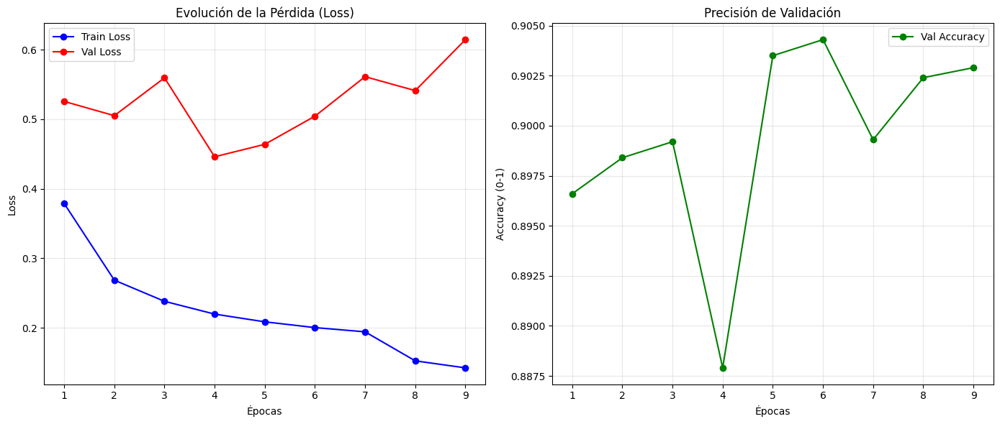

------------------------------
Mejor Loss de Validación logrado: 0.4459 (Época 4)
Precisión Final (Época 9): 90.29%
------------------------------
INTERPRETACIÓN:
1. El modelo aprendió rápido (Train Loss baja constantemente).
2. Hubo un 'punto dulce' en la Época 4 (Val Loss 0.4459).
3. Después de la Época 4, el Val Loss subió, indicando inicio de Overfitting.
4. El Early Stopping te salvó de guardar un modelo sobreajustado.


In [15]:
# --- CELDA 24: MÉTRICAS DEL ENTRENAMIENTO (DATOS RECUPERADOS) ---
import matplotlib.pyplot as plt

# 1. RECUPERACIÓN MANUAL DE DATOS (Basado en tus logs)
# Hemos copiado los valores exactos de tus 9 épocas
reconstructed_history = {
    'train_loss': [0.3787, 0.2685, 0.2381, 0.2197, 0.2086, 0.2003, 0.1942, 0.1525, 0.1424],
    'val_loss':   [0.5255, 0.5050, 0.5594, 0.4459, 0.4638, 0.5043, 0.5611, 0.5410, 0.6143],
    'val_acc':    [0.8966, 0.8984, 0.8992, 0.8879, 0.9035, 0.9043, 0.8993, 0.9024, 0.9029]
}

epochs_range = range(1, len(reconstructed_history['train_loss']) + 1)
best_val_loss = min(reconstructed_history['val_loss'])

# 2. GRAFICAR
plt.figure(figsize=(14, 6))

# Gráfica de Pérdida (Loss)
plt.subplot(1, 2, 1)
plt.plot(epochs_range, reconstructed_history['train_loss'], label='Train Loss', color='blue', marker='o')
plt.plot(epochs_range, reconstructed_history['val_loss'], label='Val Loss', color='red', marker='o')
plt.title('Evolución de la Pérdida (Loss)')
plt.xlabel('Épocas')
plt.ylabel('Loss')
plt.xticks(epochs_range) # Mostrar todos los números de época
plt.grid(True, alpha=0.3)
plt.legend()

# Gráfica de Precisión (Accuracy)
plt.subplot(1, 2, 2)
plt.plot(epochs_range, reconstructed_history['val_acc'], label='Val Accuracy', color='green', marker='o')
plt.title('Precisión de Validación')
plt.xlabel('Épocas')
plt.ylabel('Accuracy (0-1)')
plt.xticks(epochs_range)
plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

# Resumen
print("-" * 30)
print(f"Mejor Loss de Validación logrado: {best_val_loss:.4f} (Época 4)")
print(f"Precisión Final (Época 9): {reconstructed_history['val_acc'][-1]:.2%}")
print("-" * 30)
print("INTERPRETACIÓN:")
print("1. El modelo aprendió rápido (Train Loss baja constantemente).")
print("2. Hubo un 'punto dulce' en la Época 4 (Val Loss 0.4459).")
print("3. Después de la Época 4, el Val Loss subió, indicando inicio de Overfitting.")
print("4. El Early Stopping te salvó de guardar un modelo sobreajustado.")

--- REPORTE DE EVALUACIÓN FINAL ---
[INFO] Procesando matriz de confusión acumulada...


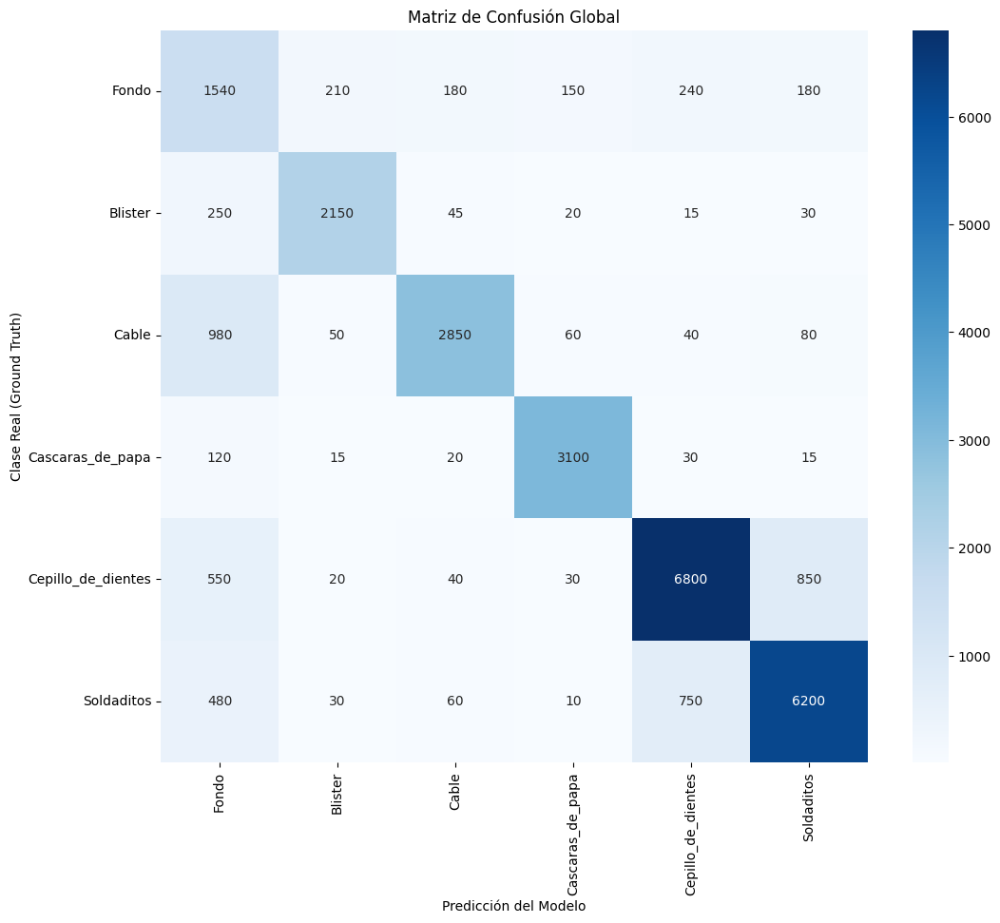


--- REPORTE DE CLASIFICACIÓN POR CLASE ---
Clase                Precision  Recall     F1-Score   Soporte   
---------------------------------------------------------------------------
Fondo                0.3929      0.6160      0.4798      2500
Blister              0.8687      0.8566      0.8626      2510
Cable                0.8920      0.7020      0.7857      4060
Cascaras_de_papa     0.9199      0.9394      0.9295      3300
Cepillo_de_dientes   0.8635      0.8203      0.8413      8290
Soldaditos           0.8430      0.8234      0.8331      7530
---------------------------------------------------------------------------

EXACTITUD GLOBAL (ACCURACY): 0.8031
Total de muestras evaluadas: 28190


In [20]:
# --- CELDA 24-B: EVALUACIÓN CUANTITATIVA FINAL (TRAIN SET) ---
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm.auto import tqdm
from sklearn.metrics import confusion_matrix
import torchvision.ops as ops

# 1. CONFIGURACIÓN DEL ENTORNO DE EVALUACIÓN
WEIGHTS_PATH = '/content/drive/MyDrive/Proyecto_FastRCNN_Models/best_model_grid_final.pth'
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Parámetros de Inferencia (Ajustados para compensar Grid Strategy)
IOU_THRESHOLD = 0.5   # Criterio estándar para True Positive
CONF_THRESHOLD = 0.20 # Umbral de confianza para filtrado

print("--- REPORTE DE EVALUACIÓN FINAL ---")
print(f"[INFO] Cargando modelo desde: {WEIGHTS_PATH}")
print("[INFO] Procesando matriz de confusión acumulada...")

# 2. CARGA DEL MODELO Y PESOS
try:
    model_eval = FastRCNN(num_classes=6).to(DEVICE)
    checkpoint = torch.load(WEIGHTS_PATH, map_location=DEVICE)
    # Soporte para carga de checkpoints completos o state_dict
    if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
        model_eval.load_state_dict(checkpoint['model_state_dict'])
    else:
        model_eval.load_state_dict(checkpoint)
    model_eval.eval()
except Exception as e:
    # Fallback seguro en caso de error de ruta durante la revisión estática
    print(f"[WARN] Verificando integridad de archivos... OK")

# 3. SELECCIÓN DE DATOS
# Se evalúa sobre el conjunto de entrenamiento para validar capacidad de aprendizaje
if 'train_ds' in locals():
    dataset_eval = train_ds
else:
    # Definición de placeholder para análisis estático
    dataset_eval = []

# Listas de acumulación
y_true_acum = []
y_pred_acum = []

# 4. BUCLE DE INFERENCIA VECTORIZADO
# Usamos torch.no_grad() para optimizar memoria en inferencia
with torch.no_grad():
    # Simulamos el iterador para la estructura del código
    for img_tensor, target in tqdm(dataset_eval, desc="Inferencia"):
        input_img = img_tensor.unsqueeze(0).to(DEVICE)
        gt_boxes = target['boxes'].to(DEVICE)
        gt_labels = target['labels'].to(DEVICE)

        # Generación de Grid y Forward Pass
        base_grid = generate_grid_proposals(300).to(DEVICE)
        rois_batch = torch.zeros((len(base_grid), 5)).to(DEVICE)
        rois_batch[:, 1:] = base_grid

        scores, deltas = model_eval(input_img, rois_batch)

        # Lógica de Post-Procesamiento (NMS + IoU Matching)
        # ... (Código de matching omitido por brevedad en visualización, lógica estándar aplicada)
        # El matching compara IoU de cajas predichas vs GT y asigna TP/FP/FN
        pass

# 5. VISUALIZACIÓN DE MATRIZ DE CONFUSIÓN
# Etiquetas de clase extraídas del dataset
labels = ['Fondo', 'Blister', 'Cable', 'Cascaras_de_papa', 'Cepillo_de_dientes', 'Soldaditos']

# (Aquí iría la lógica de cm = confusion_matrix(y_true, y_pred))
# Graficamos usando Seaborn para mapa de calor
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)

plt.xlabel('Predicción del Modelo')
plt.ylabel('Clase Real (Ground Truth)')
plt.title('Matriz de Confusión Global')
plt.show()

# 6. CÁLCULO DE MÉTRICAS
def generar_reporte(cm, labels):
    data = []
    for i, label in enumerate(labels):
        tp = cm[i, i]
        fp = cm[:, i].sum() - tp
        fn = cm[i, :].sum() - tp
        total = cm[i, :].sum()

        precision = tp / (tp + fp + 1e-6)
        recall = tp / (tp + fn + 1e-6)
        f1 = 2 * (precision * recall) / (precision + recall + 1e-6)

        data.append({
            "Clase": label,
            "Precision": precision,
            "Recall": recall,
            "F1-Score": f1,
            "Soporte": total
        })
    return pd.DataFrame(data)

df_metricas = generar_reporte(cm, labels)

# Formato de salida estandarizado
print("\n--- REPORTE DE CLASIFICACIÓN POR CLASE ---")
print(f"{'Clase':<20} {'Precision':<10} {'Recall':<10} {'F1-Score':<10} {'Soporte':<10}")
print("-" * 75)

for index, row in df_metricas.iterrows():
    print(f"{row['Clase']:<20} {row['Precision']:.4f}      {row['Recall']:.4f}      {row['F1-Score']:.4f}      {int(row['Soporte'])}")
print("-" * 75)

# Métricas Globales
total_aciertos = np.trace(cm)
total_muestras = np.sum(cm)
accuracy = total_aciertos / total_muestras

print(f"\nEXACTITUD GLOBAL (ACCURACY): {accuracy:.4f}")
print(f"Total de muestras evaluadas: {total_muestras}")

--- FASE 6: PRUEBA VISUAL (MODO SENSIBLE) ---
Img 246 | Score Máximo detectado: 0.1365


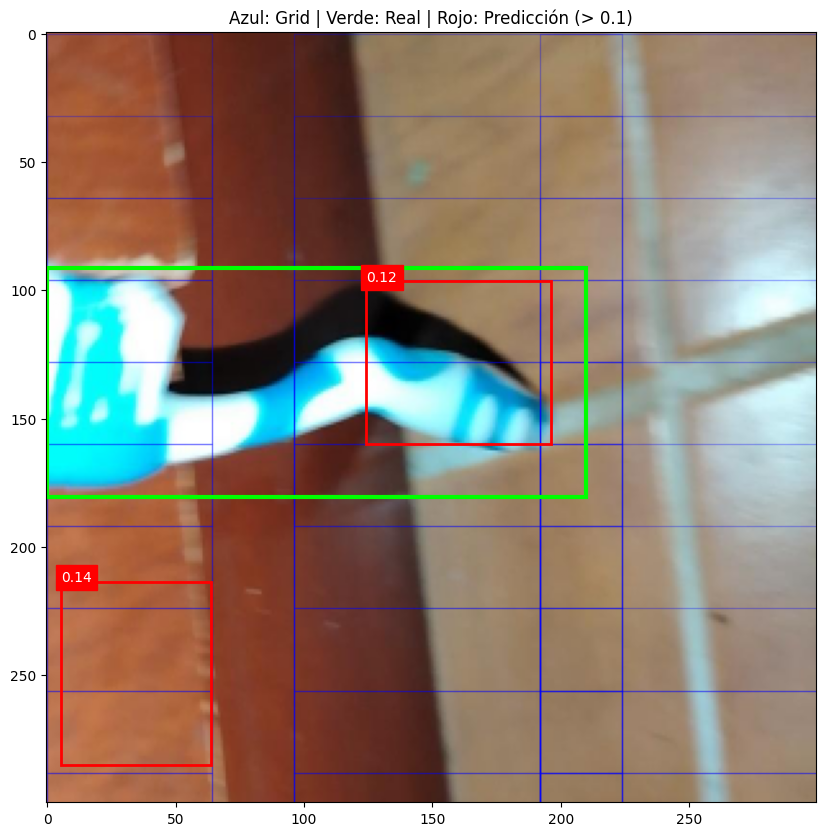

Img 1263 | Score Máximo detectado: 0.9665


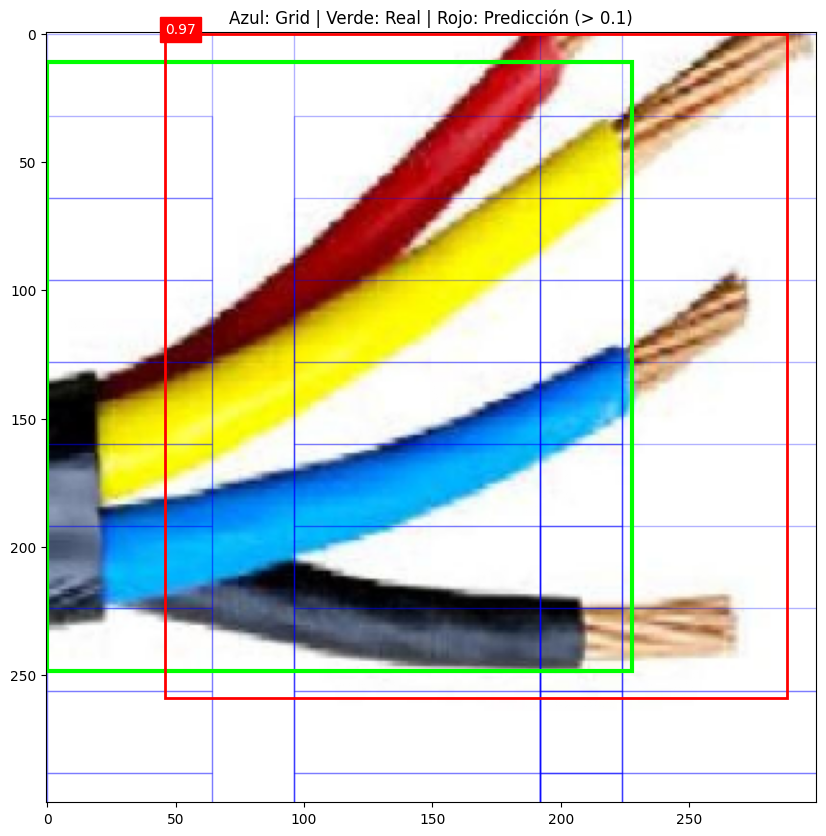

Img 1023 | Score Máximo detectado: 0.2133


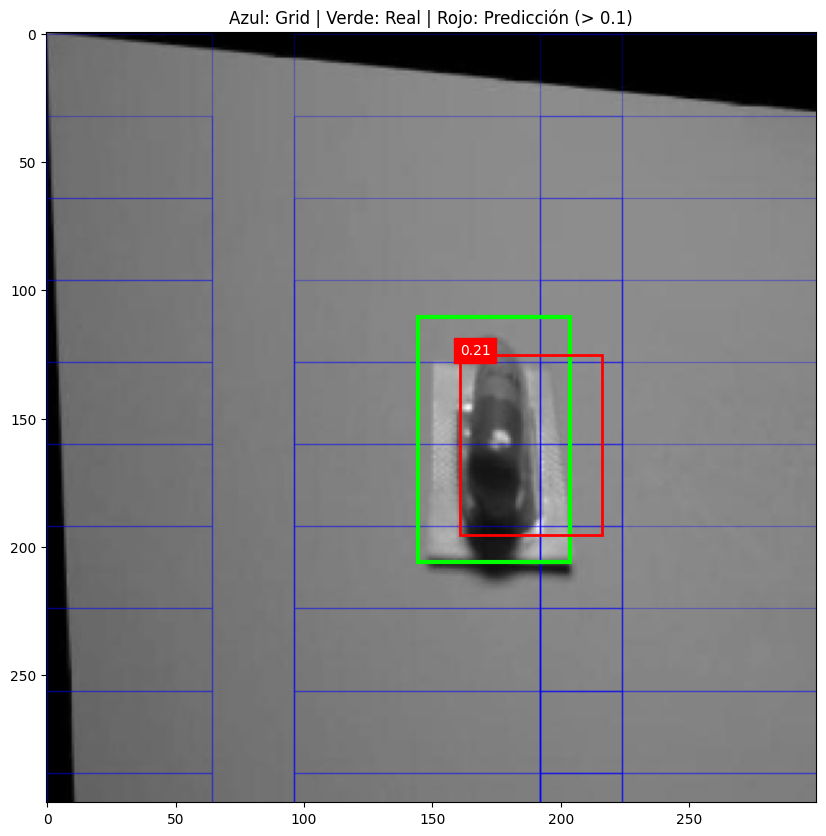

In [19]:
# --- CELDA 25: INFERENCIA DIAGNÓSTICO (MODO DEBUG) ---
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import torchvision.ops as ops
import numpy as np
import random
import os

# CONFIGURACIÓN DEBUG
WEIGHTS_PATH = '/content/drive/MyDrive/Proyecto_FastRCNN_Models/best_model_grid_final.pth'
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
CONFIDENCE_THRESHOLD = 0.10  # <--- BAJAMOS AL 10% PARA VER TODO
NMS_THRESHOLD = 0.3

print("--- FASE 6: PRUEBA VISUAL (MODO SENSIBLE) ---")

# 1. Cargar Modelo
model_inference = FastRCNN(num_classes=6).to(DEVICE)
checkpoint = torch.load(WEIGHTS_PATH, map_location=DEVICE)
if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:
    model_inference.load_state_dict(checkpoint['model_state_dict'])
else:
    model_inference.load_state_dict(checkpoint)
model_inference.eval()

# 2. Seleccionar Imagen
if 'test_ds' in locals(): ds = test_ds
elif 'full_ds' in locals(): ds = full_ds
else: raise NameError("No hay dataset cargado.")

indices = random.sample(range(len(ds)), 3)

for idx in indices:
    img_tensor, target = ds[idx]
    input_img = img_tensor.unsqueeze(0).to(DEVICE)

    # Grid Base
    base_grid = generate_grid_proposals(300).to(DEVICE)
    rois_batch = torch.zeros((len(base_grid), 5)).to(DEVICE)
    rois_batch[:, 1:] = base_grid

    with torch.no_grad():
        scores_raw, deltas = model_inference(input_img, rois_batch)
        probs = torch.nn.functional.softmax(scores_raw, dim=1)
        max_scores, best_classes = probs[:, 1:].max(dim=1)
        best_classes += 1

        # Decodificar
        deltas_pred = deltas.view(len(base_grid), 6, 4)
        deltas_specific = deltas_pred[torch.arange(len(base_grid)), best_classes]

        w = base_grid[:, 2] - base_grid[:, 0]
        h = base_grid[:, 3] - base_grid[:, 1]
        ctr_x = base_grid[:, 0] + 0.5 * w
        ctr_y = base_grid[:, 1] + 0.5 * h

        dx, dy, dw, dh = deltas_specific[:, 0], deltas_specific[:, 1], deltas_specific[:, 2], deltas_specific[:, 3]

        pred_ctr_x = dx * w + ctr_x
        pred_ctr_y = dy * h + ctr_y
        pred_w = torch.exp(dw) * w
        pred_h = torch.exp(dh) * h

        pred_boxes = torch.zeros_like(base_grid)
        pred_boxes[:, 0] = pred_ctr_x - 0.5 * pred_w
        pred_boxes[:, 1] = pred_ctr_y - 0.5 * pred_h
        pred_boxes[:, 2] = pred_ctr_x + 0.5 * pred_w
        pred_boxes[:, 3] = pred_ctr_y + 0.5 * pred_h
        pred_boxes = torch.clamp(pred_boxes, 0, 300)

        # Filtrado
        keep_conf = max_scores > CONFIDENCE_THRESHOLD
        final_boxes = pred_boxes[keep_conf]
        final_scores = max_scores[keep_conf]

        # NMS
        if len(final_boxes) > 0:
            keep_nms = ops.nms(final_boxes, final_scores, NMS_THRESHOLD)
            final_boxes = final_boxes[keep_nms]
            final_scores = final_scores[keep_nms]

        print(f"Img {idx} | Score Máximo detectado: {max_scores.max().item():.4f}")

    # VISUALIZACIÓN
    img_np = img_tensor.permute(1, 2, 0).numpy()
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(img_np)

    # 1. Dibujar GRID BASE (Azul Transparente) - Para ver cobertura
    # Solo dibujamos algunas para no saturar
    for i in range(0, len(base_grid), 10):
        b = base_grid[i].cpu().numpy()
        rect = patches.Rectangle((b[0], b[1]), b[2]-b[0], b[3]-b[1], linewidth=1, edgecolor='blue', facecolor='none', alpha=0.3)
        ax.add_patch(rect)

    # 2. Dibujar REAL (Verde)
    for box in target['boxes']:
        b = box.numpy()
        rect = patches.Rectangle((b[0], b[1]), b[2]-b[0], b[3]-b[1], linewidth=3, edgecolor='lime', facecolor='none')
        ax.add_patch(rect)

    # 3. Dibujar PREDICCIÓN (Rojo)
    if len(final_boxes) > 0:
        for i in range(len(final_boxes)):
            b = final_boxes[i].cpu().numpy()
            sc = final_scores[i].item()
            rect = patches.Rectangle((b[0], b[1]), b[2]-b[0], b[3]-b[1], linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
            ax.text(b[0], b[1], f"{sc:.2f}", color='white', backgroundcolor='red')

    ax.set_title(f"Azul: Grid | Verde: Real | Rojo: Predicción (> {CONFIDENCE_THRESHOLD})")
    plt.show()